# Load Data

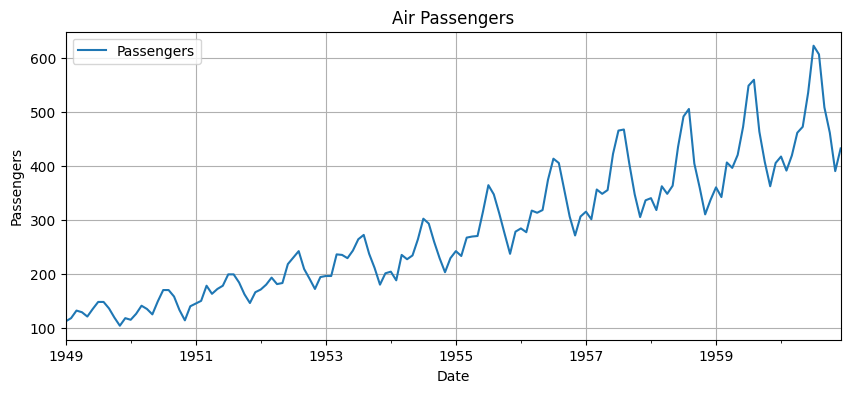

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
data = {
    'X_train': X[:train_size],
    'y_train': y[:train_size],
    'X_val': X[train_size:train_size + val_size],
    'y_val': y[train_size:train_size + val_size],
    'X_test': X[train_size + val_size:],
    'y_test': y[train_size + val_size:]
}

# Confirm sizes
print(f"Train size: {len(data['X_train'])}, Val size: {len(data['X_val'])}, Test size: {len(data['X_test'])}")

Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

data['X_train_scaled'] = scaler_X.fit_transform(np.array(data['X_train']).reshape(-1,1))
data['X_val_scaled'] = scaler_X.transform(np.array(data['X_val']).reshape(-1,1))
data['y_train_scaled'] = scaler_y.fit_transform(np.array(data['y_train']).reshape(-1, 1)).ravel()
data['y_val_scaled'] = scaler_y.transform(np.array(data['y_val']).reshape(-1, 1)).ravel()
# X_test_scaled = 
# y_test_scaled = 


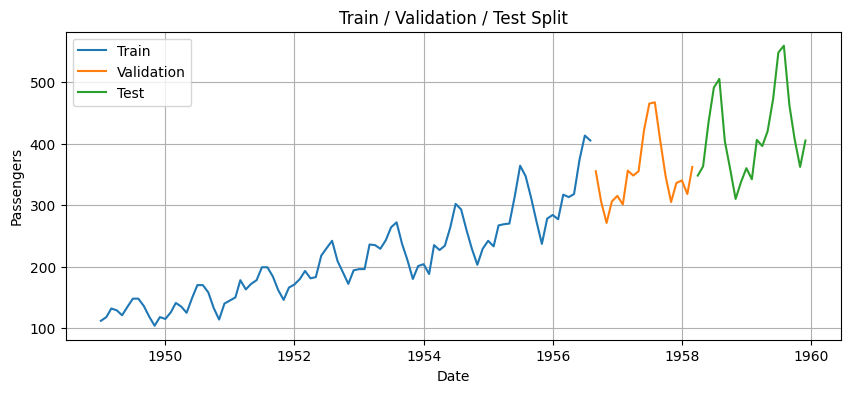

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(data['X_train'], label="Train")
plt.plot(data['X_val'], label="Validation")
plt.plot(data['X_test'], label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import combinations, zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, data):
    X_train = data['X_train_scaled']
    y_train = data['y_train_scaled']
    X_val = data['X_val_scaled']
    y_val = data['y_val_scaled']


    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, data):
    X_train = data['X_train_scaled']
    y_train = data['y_train_scaled']
    X_val = data['X_val_scaled']
    y_val = data['y_val_scaled']


    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [16]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

Initializing population...
Population created: 
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 1, 'd': 0, 'q': 0} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 87.23139732628952, 'gamma': 'scale', 'epsilon': 0.26210929735210076} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 93.02708146471406, 'gamma': 'scale', 'epsilon': 0.17585849789830213} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 37.39925786232581, 'gamma': 'scale', 'epsilon': 0.19137204472488228} Fitness: 0.0
SVRModel {'kernel': 'linear', 'c': 42.62951982573049, 'gamma': 'scale', 'epsilon': 0.14059147356325025} Fitness: 0.0
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 0.0
MLPModel {'hidden_layer_sizes': 19, 'learning_rate': 0.05774723382310978} Fitness: 0.0
MLPModel {'hidden_layer_sizes': 6, 'learnin

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


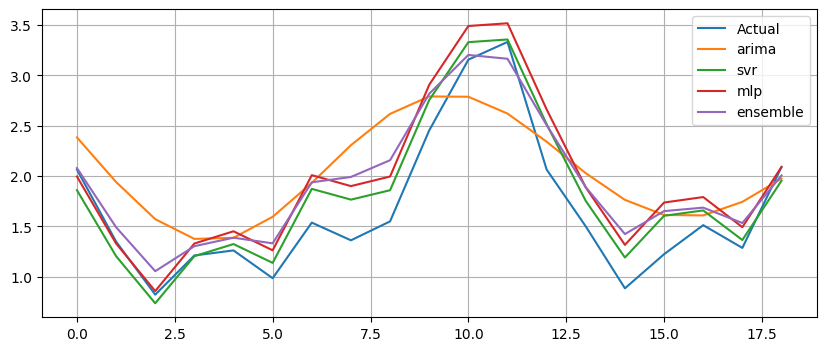

Generation 1: Fitness = 2.36561


ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0918467642083844
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.099001687788562
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1667423538876909
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8690647711791608
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6377357148469067
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7057260692724423
SVRModel {'kernel': 'linear', 'c': 42.62951982573049, 'gamma': 'scale', 'epsilon': 0.14059147356325025} Fitness: 2.1241614548188017
SVRModel {'kernel': 'linear', 'c': 78.5833214991768, 'gamma': 'scale', 'epsilon': 0.14059147356325025} Fitness: 2.1111277423779304
SVRModel {'kernel': 'poly', 'c': 48.01719161070966, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 1.454184032113003
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.68356108

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


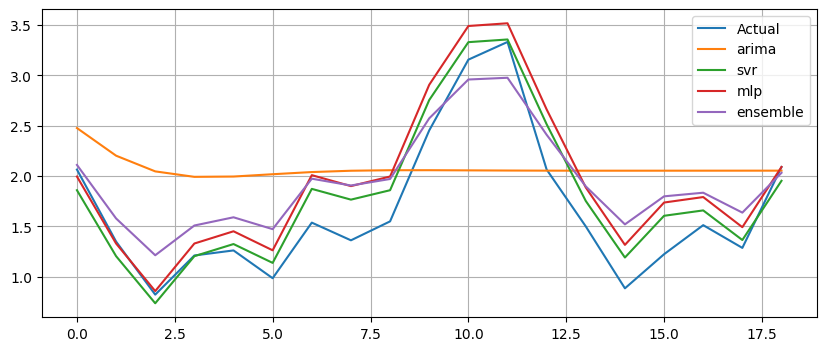

Generation 2: Fitness = 2.18618


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.195233839754129
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0778263478114996
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0918467642083844
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1699447877511797
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6377357148469067
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.699765546122894
SVRModel {'kernel': 'linear', 'c': 42.62951982573049, 'gamma': 'scale', 'epsilon': 0.14059147356325025} Fitness: 2.11961806433793
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7057260692724423
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.704766408186623
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.68356108

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


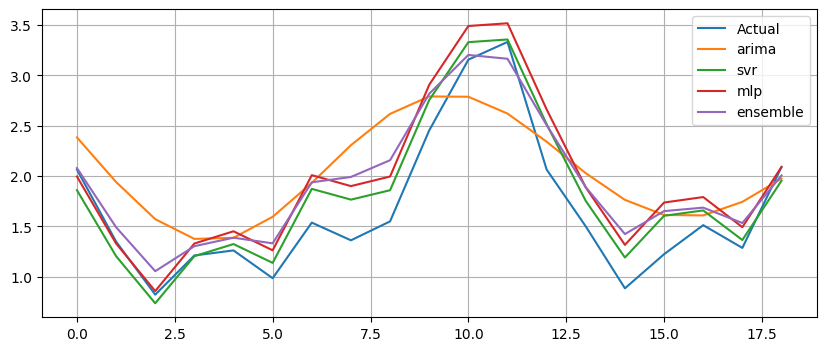

Generation 3: Fitness = 2.36561




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.195233839754129
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1721159978544113
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0918467642083844
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8498516676405052
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1941260447092916
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.699765546122894
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7031780260237372
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7057260692724423
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.385637609351044
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.29775131418484807} Fitness: 3.0871993918150373
MLPModel {'hidden_layer_

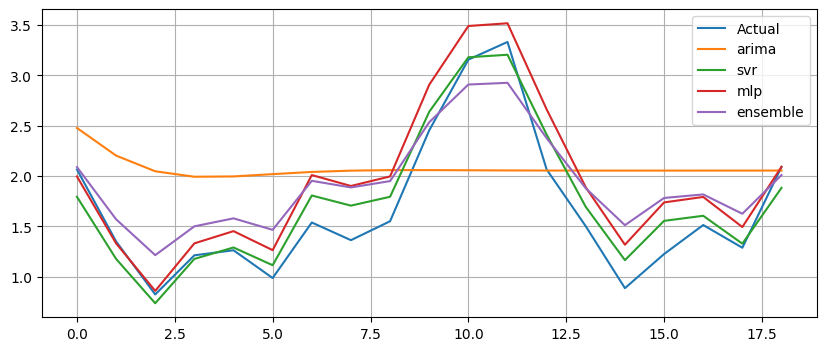

Generation 4: Fitness = 2.23452




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1721159978544113
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.195233839754129
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.195233839754129
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1721159978544113
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7031780260237372
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.699765546122894
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.699765546122894
SVRModel {'kernel': 'linear', 'c': 69.8500081050529, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.7031780260237372
MLPModel {'hidden_layer_sizes

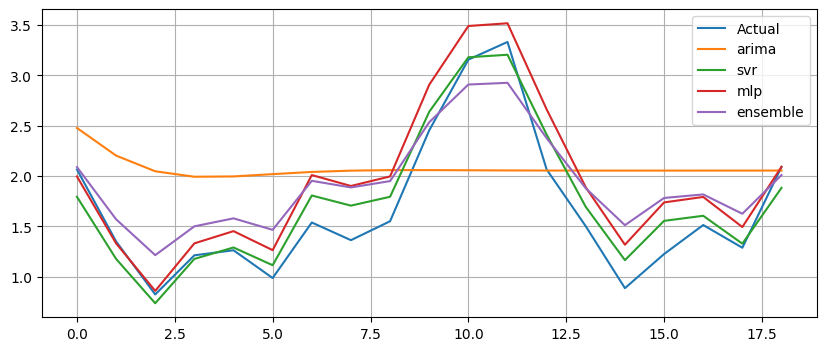

Generation 5: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1956697361823487
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.195233839754129
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1943345249891637
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8317015360827339
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1960879277313192
SVRModel {'kernel': 'linear', 'c': 82.76810795561629, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.348864056295466
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.41163943069263276} Fitness: 3.699765546122894
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.350028435148901
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.391462061601697
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.348394456701

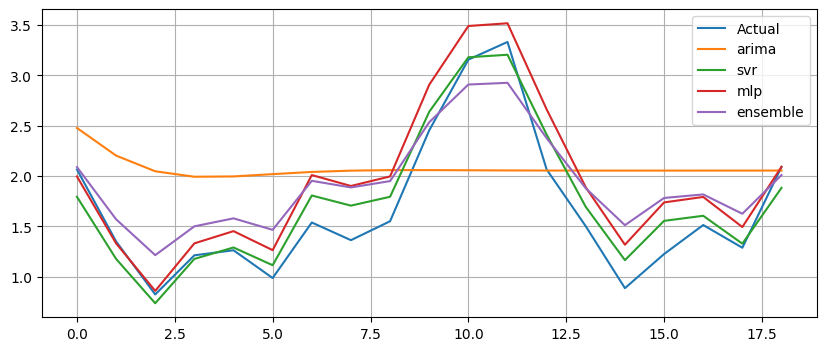

Generation 6: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1956291385115272
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1337766461613228
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.350016334212195
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.75306919267055, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 82.98603204710173, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.3493889515691375
M

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


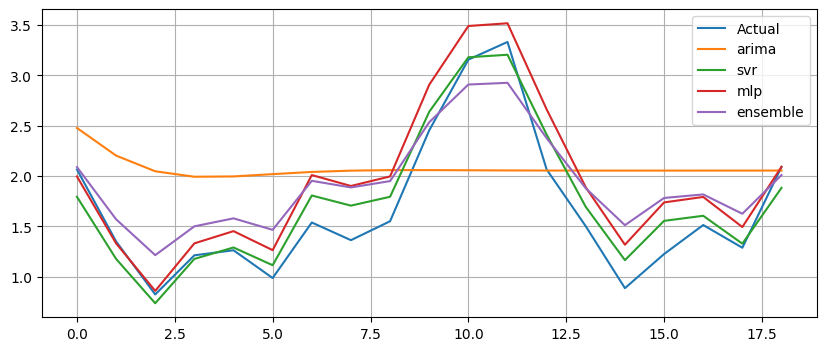

Generation 7: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1949082131158424
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194694641361771
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1955392473299433
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.392030919000986} Fitness: 3.4862078924030424
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4256793184737152} Fitness: 4.0707797668798404
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349883014488207


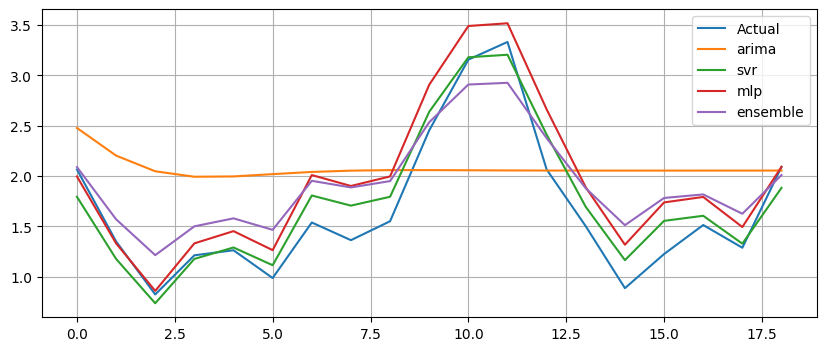

Generation 8: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.207587895336669
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1960879277313192
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.045631899267467
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.351769220278878
SVRModel {'kernel': 'linear', 'c': 71.99697180852327, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.348394456701974
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.357404899692727
ML

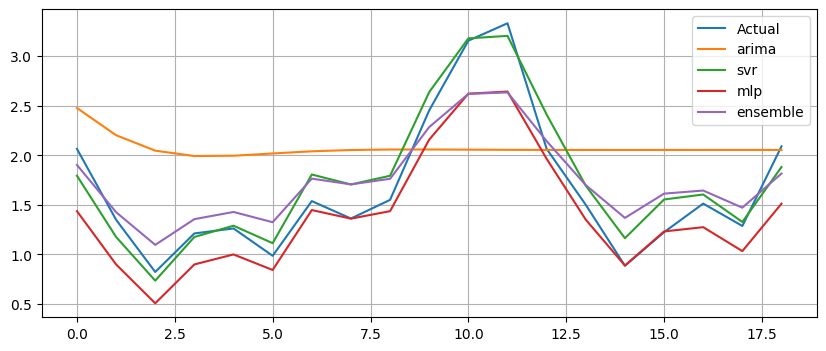

Generation 9: Fitness = 2.66570


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.192504730742087
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0836006837223988
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8843088998646043
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.207587895336669
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349557361768919
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.363302325012619
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 1.493241126381107
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.351769220278878
ML

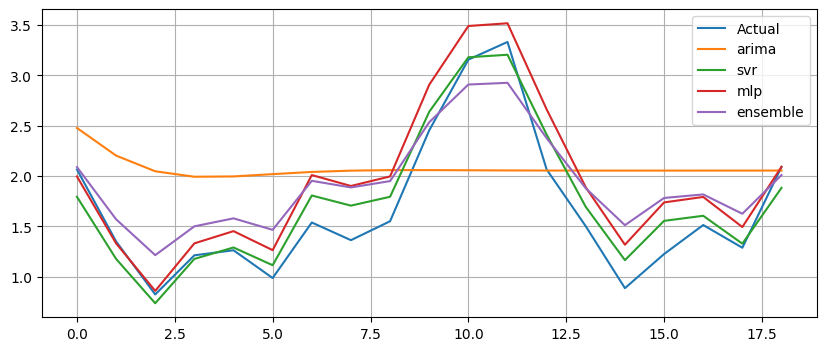

Generation 10: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1943345249891637
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1953767571292828
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1956576028098373
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
SVRModel {'kernel': 'linear', 'c': 82.35855169249064, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.350028435148901
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349658003501203
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.350052980469809
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985

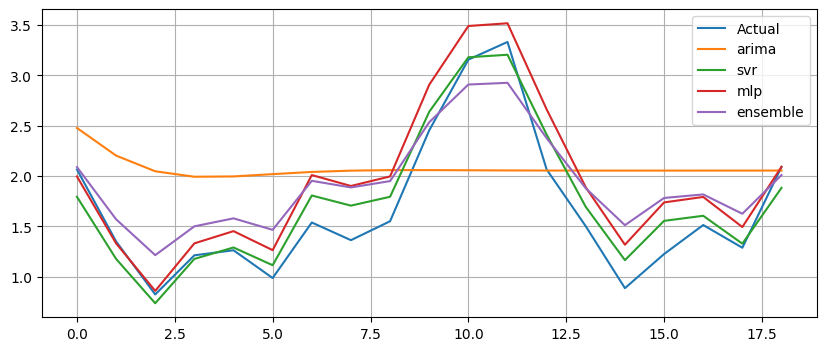

Generation 11: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1953767571292828
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1895308870678125
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1954945689492589
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0589969306341533
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349658003501203
SVRModel {'kernel': 'rbf', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 1.5186775563363308
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349798494561516
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.37295073881778


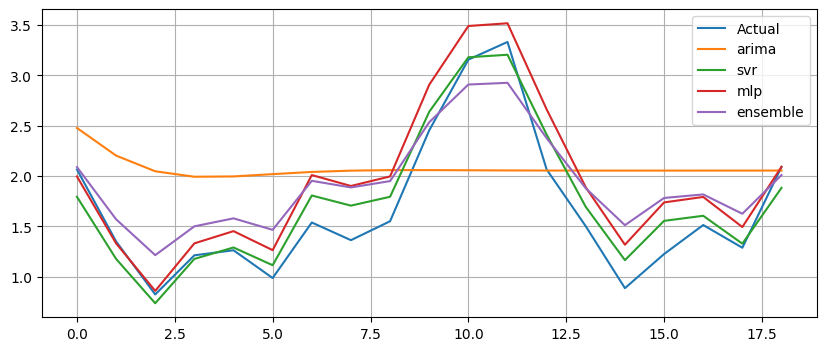

Generation 12: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1953767571292828
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1945448163711194
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8843088998646043
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8387522086770408
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349658003501203
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.33888151985341475} Fitness: 3.493777482914429
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 1.493241126381107
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.42927110846053335} Fitness: 4.2106291797492

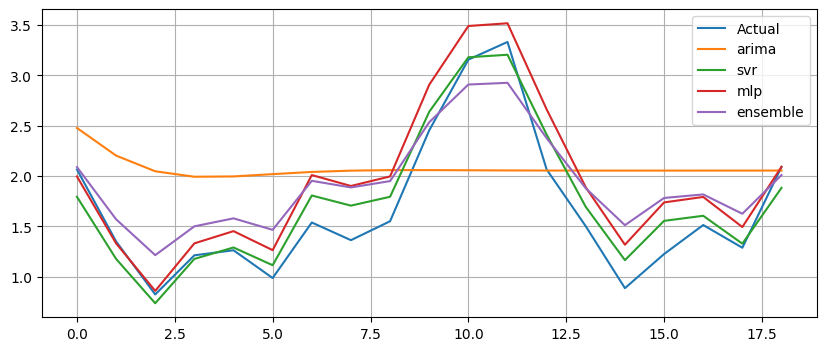

Generation 13: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0742607516844012
ArimaModel {'p': 0, 'd': 1, 'q': 1} Fitness: 0.8387522086770408
ArimaModel {'p': 2, 'd': 1, 'q': 0} Fitness: 0.857423748404185
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0738663023570132
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1924677984842194
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.42927110846053335} Fitness: 4.1819579255640065
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.42927110846053335} Fitness: 4.210629179749202
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.3835072444757195
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.358701479052725
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.34891832

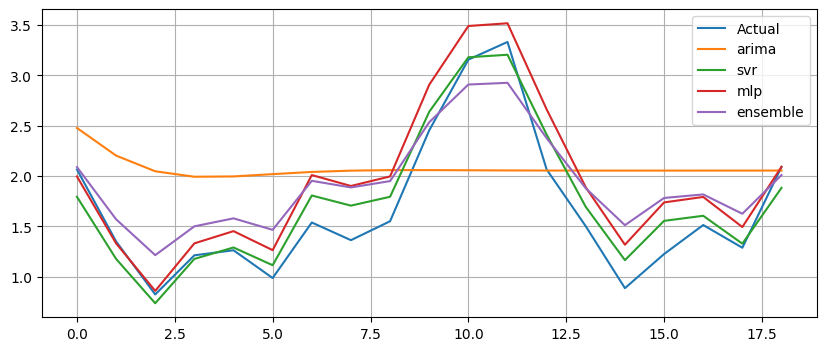

Generation 14: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0756988058674255
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1954396043359155
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0738663023570132
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.361418412479206
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.349701831102035
SVRModel {'kernel': 'linear', 'c': 81.36514269622978, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.358701479052725

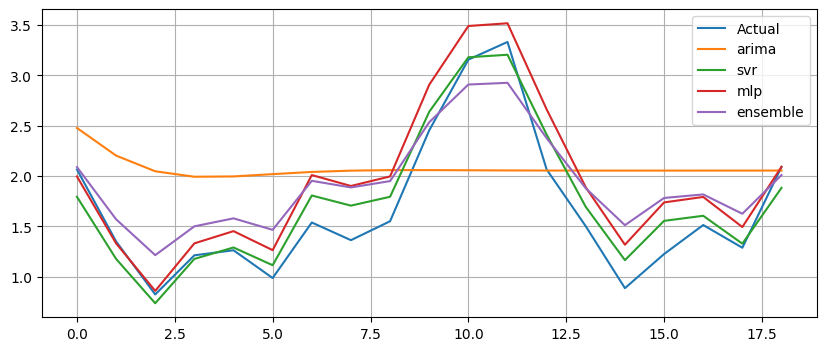

Generation 15: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1960120540608656
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 81.36514269622978, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 81.36514269622978, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.348316738239819
MLP

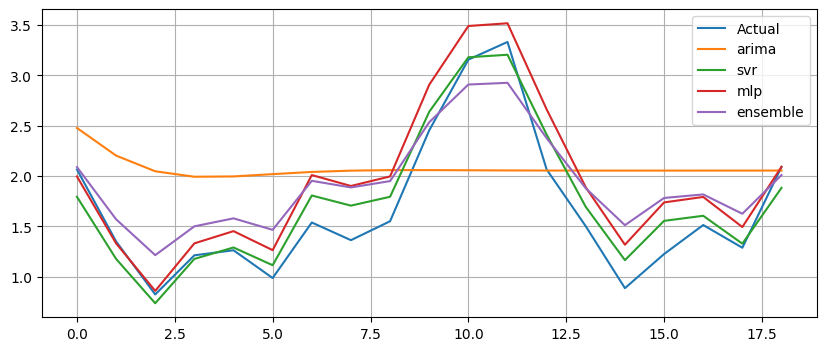

Generation 16: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9491051094492184
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8843088998646043
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 4.347168374319018
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 4.347168374319018
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.3659620163463675
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 1.493241126381107


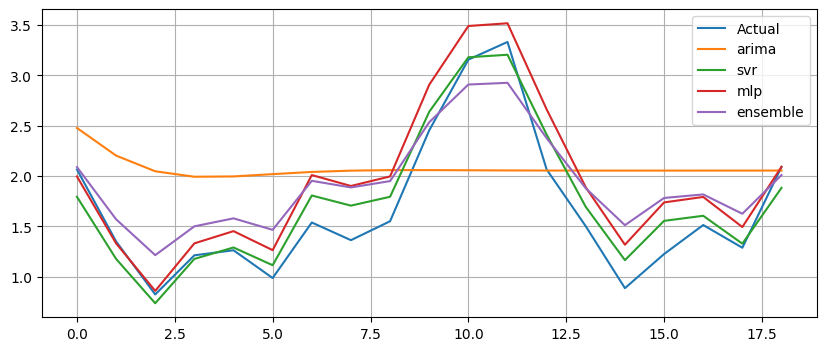

Generation 17: Fitness = 2.23452


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8843088998630133
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1961309698129232
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 4.347168374319018
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 1.4932411263784928
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4369927746338061} Fitness: 4.347168374318985
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 4.353782445080045

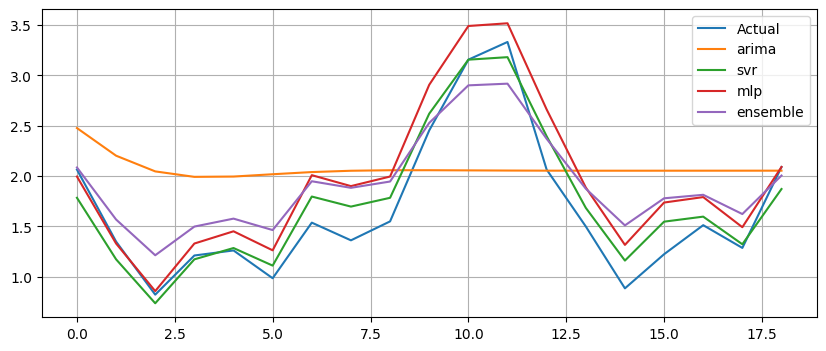

Generation 18: Fitness = 2.23886


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1887401997276477
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.19437720995859
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'rbf', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 1.514858191728862
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.43699277463380604} Fitness: 4.347168374319018
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
MLPMo

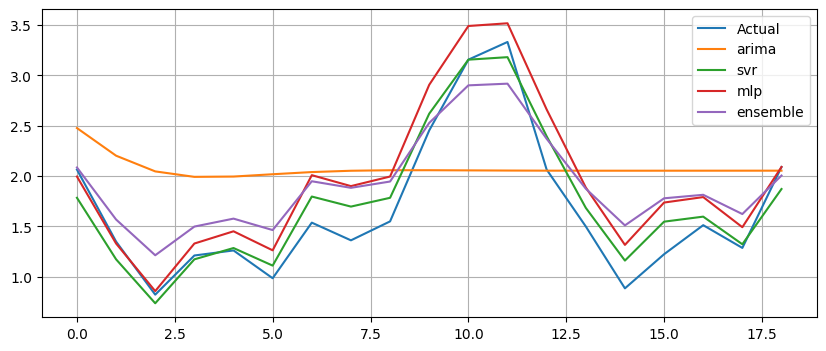

Generation 19: Fitness = 2.23886


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1948571743817753
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.39594761212853774} Fitness: 3.55382328610438
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
MLP

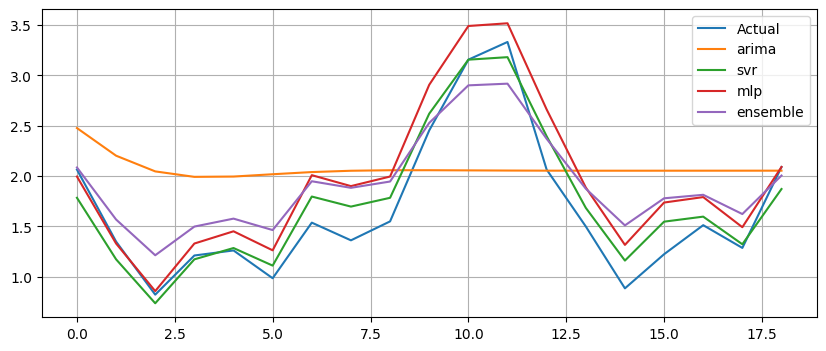

Generation 20: Fitness = 2.23886


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1941603649098076
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0735857410940821
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.4202093614227564
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.428675786155477


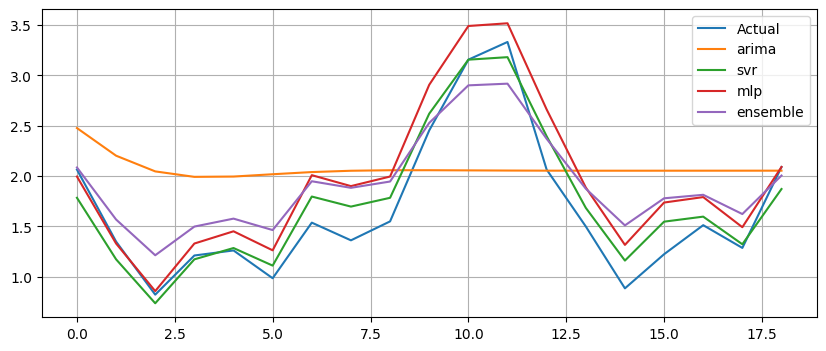

Generation 21: Fitness = 2.23886




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1532403821517523
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1953196873148337
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.8331576090939277
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.194203049879234
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.539907548339742
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.419980872204727
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 1.4104611588419986
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4472068870547092} Fitness: 4.41724908260531
MLPModel {'hidden_layer_sizes': 24

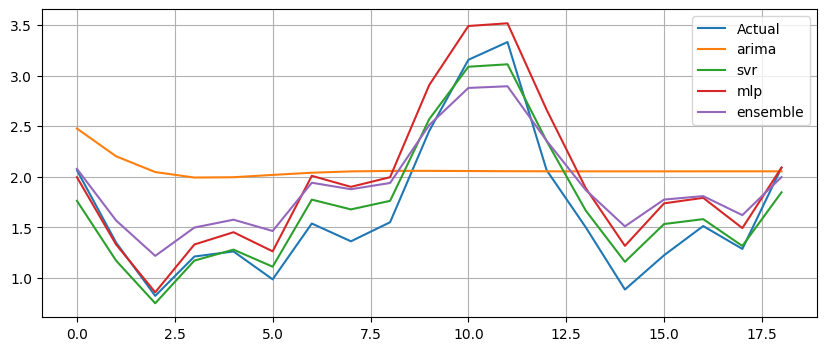

Generation 22: Fitness = 2.24361


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1941302423053817
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.2068133509266952
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1935383926647738
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1930700852077698
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1935383926647738
SVRModel {'kernel': 'linear', 'c': 92.14327201487097, 'gamma': 'scale', 'epsilon': 0.4516798061608487} Fitness: 4.43342287728742
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.48610934039165965} Fitness: 4.529636681709969
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.534715868789532
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.537619948597441
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.5347158687

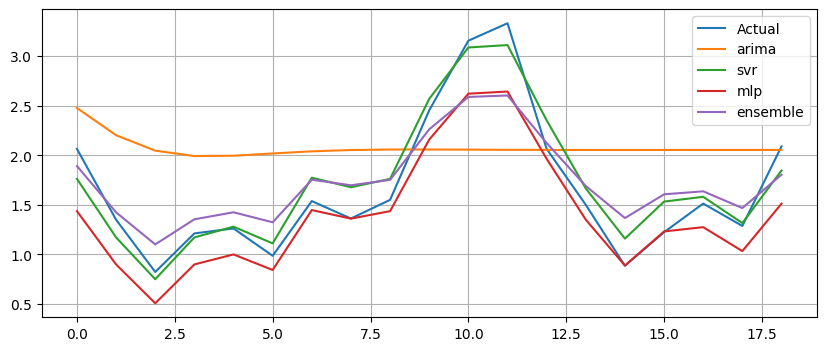

Generation 23: Fitness = 2.61887


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.7125371646602958
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.082342730472814
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.197268845031267
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1951732367670496
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.207326097206055
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 1.2311254483128575
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.548373326032593
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.54128643284222
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.53607621340888
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.45259837512296663} Fitness: 4.440481961665695

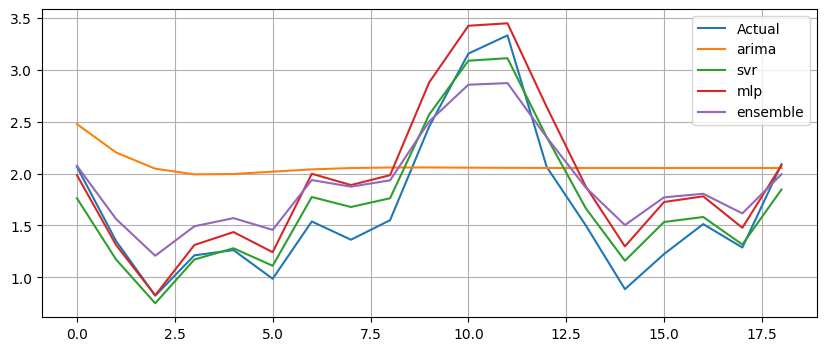

Generation 24: Fitness = 2.25318


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.193056342960464
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1331836377637747
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1910329484161468
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1915208696404083
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1943146800390743
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.534166810480114
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.536896012978237
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.534093414930742
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.5341562975934915
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.535237901

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


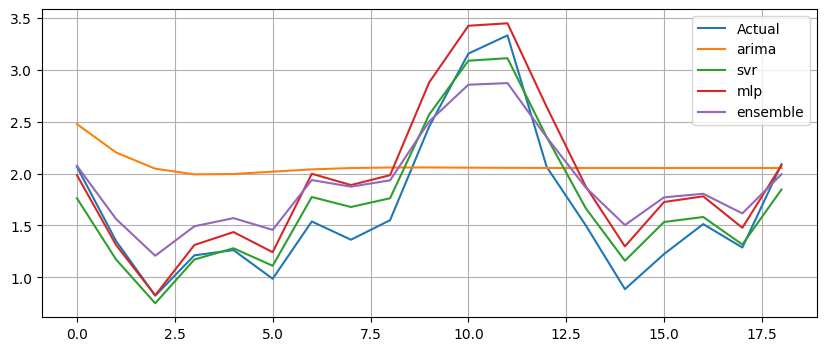

Generation 25: Fitness = 2.25318


ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.193056342960464
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8338652170267561
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.4329542406171938
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1915208696404083
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.193056342960464
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.534166810480114
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.580453864672337
SVRModel {'kernel': 'poly', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 1.2136682101363088
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.5341562975934915
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.5341668104

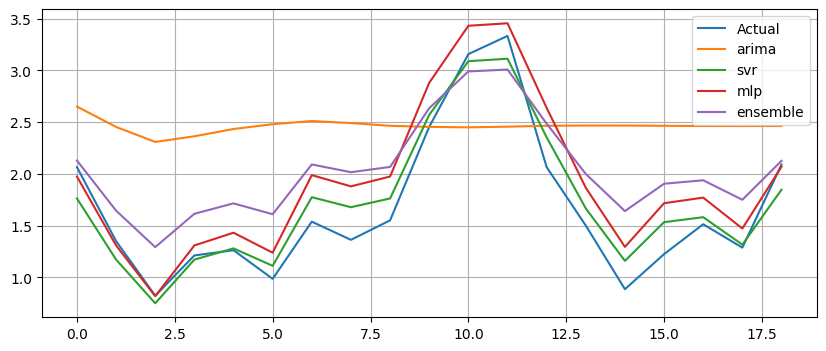

Generation 26: Fitness = 1.84204


ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.949801179612347
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1933415405976349
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9503066302959692
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2344500972366586
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9463206762229524
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.554141743043699
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.53406533142791
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.554040263991495
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.532089797173008
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.55822592

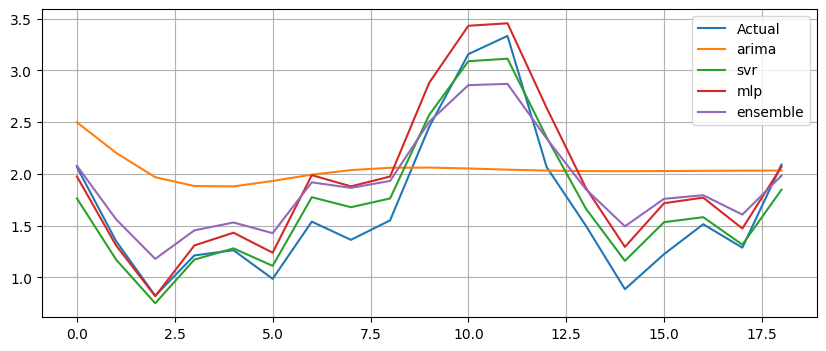

Generation 27: Fitness = 2.32416


ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9503066302959692
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.045541304037081
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.834527689583542
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1933415405976349
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.554040263991495
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.544741142231201
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.580352385620133
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.53406533142791
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.53198831812

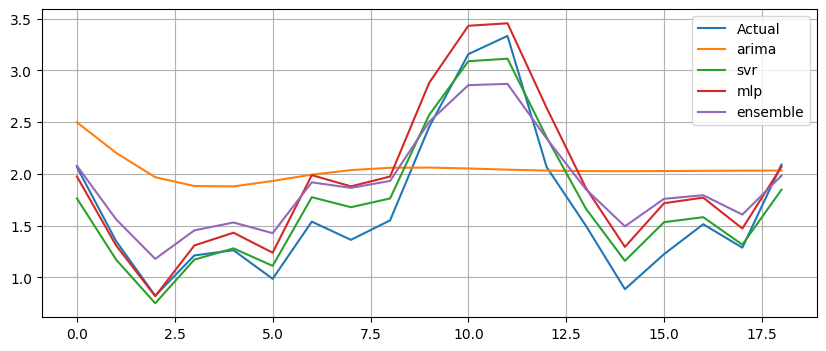

Generation 28: Fitness = 2.32416


ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2363064330344329
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
ArimaModel {'p': 2, 'd': 1, 'q': 1} Fitness: 1.1860540026864599
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.531988318120803
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.531988318120803
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4176492028834639} Fitness: 3.8575915212854697
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.531988318120803
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.54726508

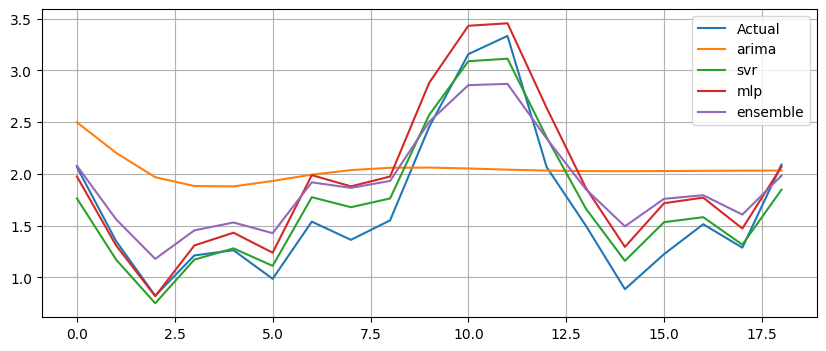

Generation 29: Fitness = 2.32416




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1503205991691237
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.536198253636291
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.531988318120803
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.531988318120803
SVRModel {'kernel': 'linear', 'c': 78.97097267300286, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.531988318120803
MLPModel {'hidden_layer_si

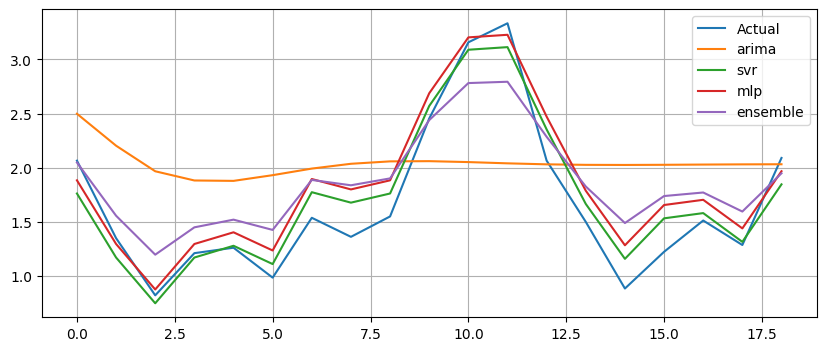

Generation 30: Fitness = 2.32651




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.148004584863474
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347921641655522
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8568556864373675
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2347160833509627
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.534652447904244
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 80.51451208498142, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.53214054800818
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.571893222895931
SVRModel {'kernel': 'linear', 'c': 81.26534645552351, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.531988318120803
MLPModel {'hidden_layer_sizes'

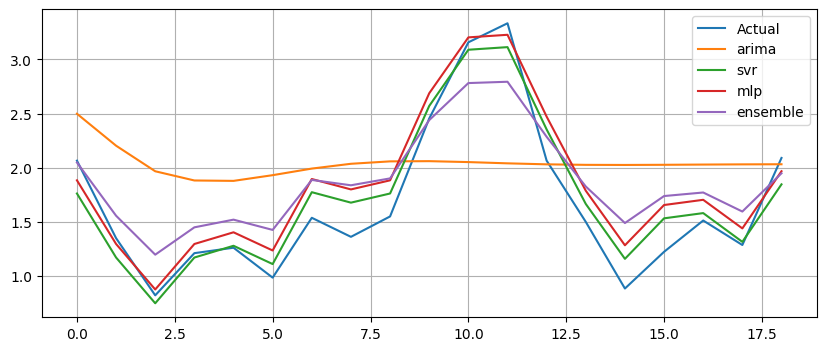

Generation 31: Fitness = 2.32651


ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2327036709801134
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2429425050988017
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.532461900486111
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.49058225949779916} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.541838753850823
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.5304425123

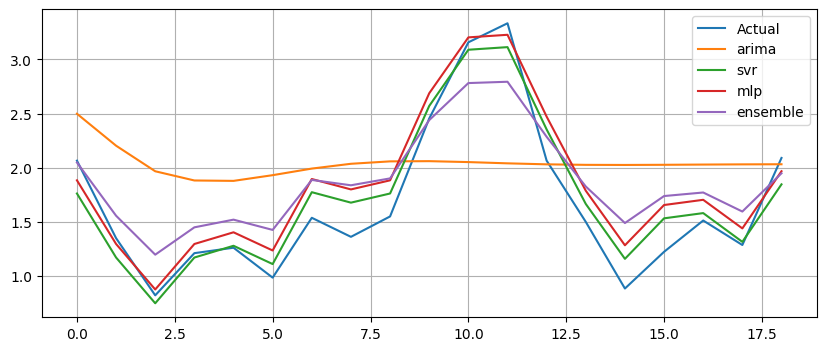

Generation 32: Fitness = 2.32651




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2369619324268275
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2365186308586282
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8568556864373675
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2373052906003612
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.532740789646027
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.531235042946497
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.571893222895931
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.540974271472687
MLPModel {'hidden_layer_sizes'

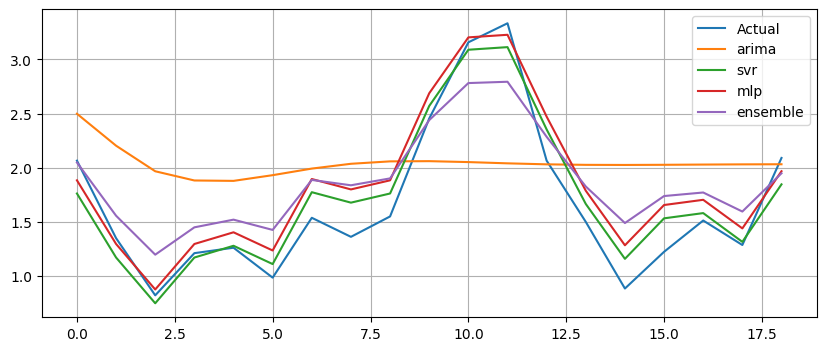

Generation 33: Fitness = 2.32651


ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2310328184551533
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530878761887275
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.53044251238

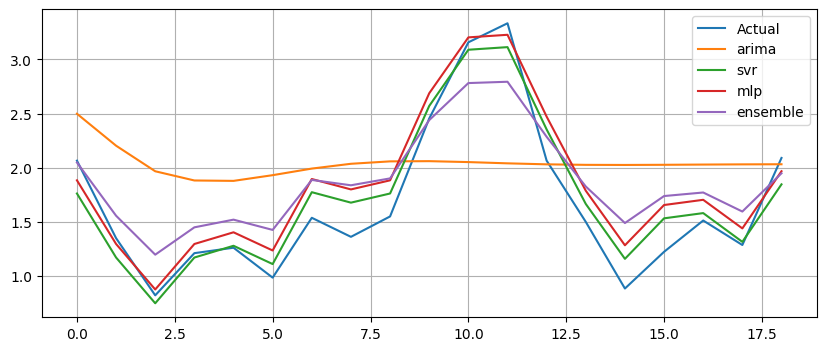

Generation 34: Fitness = 2.32651




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6266511628184246
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2390746087008535
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52991704431965
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 83.97099328415598, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.544064216409223
MLPModel {'hidden_layer_sizes': 18, 'learning_r

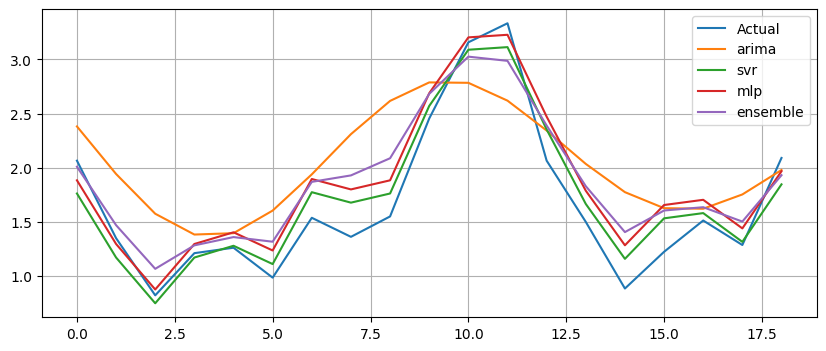

Generation 35: Fitness = 2.60680




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2311335732293585
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.231077020027763
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1311666408210574
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530442512388755
SVRModel {'kernel': 'linear', 'c': 82.08594611144294, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 82.38651258939035, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530649260143343
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.535167716780984
MLPModel {'hidden_layer_sizes': 18, 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


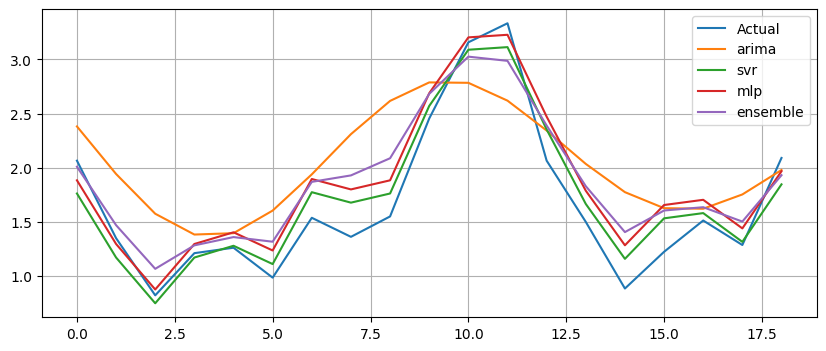

Generation 36: Fitness = 2.60680




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6291223529258607
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.635425647813702
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.635425647813702
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 82.38651258939035, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.521001699354554
SVRModel {'kernel': 'rbf', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 1.4970486937462646
SVRModel {'kernel': 'rbf', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 1.4970486937462646
MLPModel {'hidden_layer_sizes': 18, 'learn

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


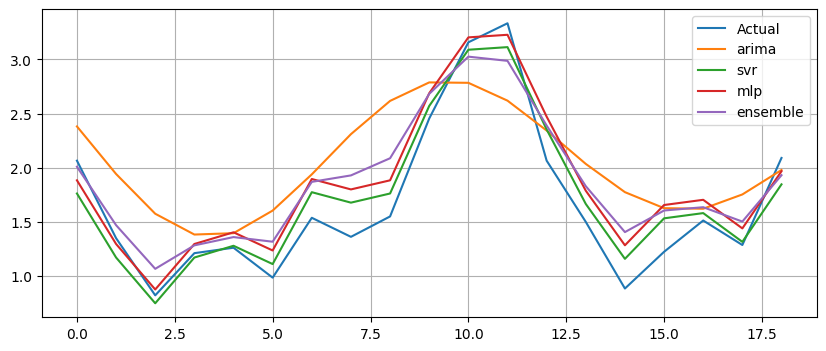

Generation 37: Fitness = 2.60680




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 2.0606638103200425
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6287513435768393
SVRModel {'kernel': 'linear', 'c': 82.38651258939035, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 82.38651258939035, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'poly', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 1.1520701905217812
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.519298874180503
MLPModel {'hidden_layer_sizes': 18, '

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


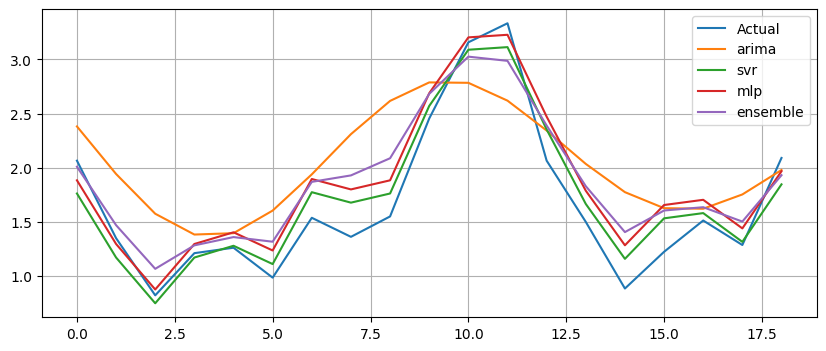

Generation 38: Fitness = 2.60680




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 82.38651258939035, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
MLPModel {'hidden_layer_sizes': 18, 'le

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


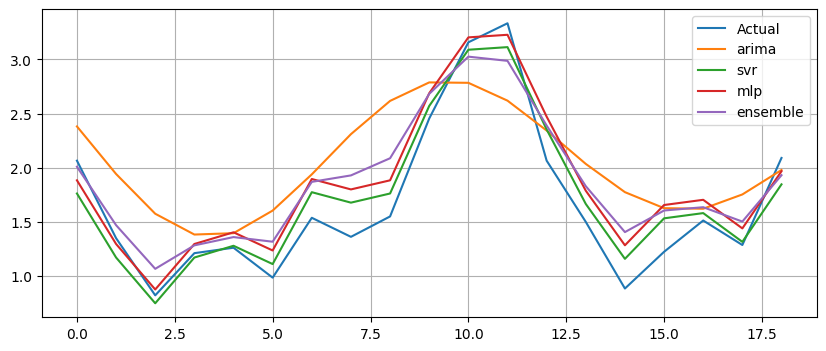

Generation 39: Fitness = 2.60680




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6325741084839036
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.528396838385299
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
MLPModel {'hidden_layer_sizes': 18, 'le

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


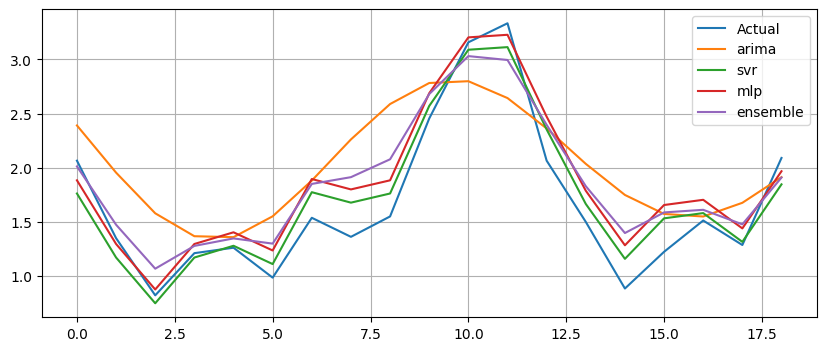

Generation 40: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685419739176972
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0815714287091454
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.626631919762826
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516742838525609
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.541528163259994
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517000596923231
MLPModel {'hidden_layer_sizes': 18, 'l

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


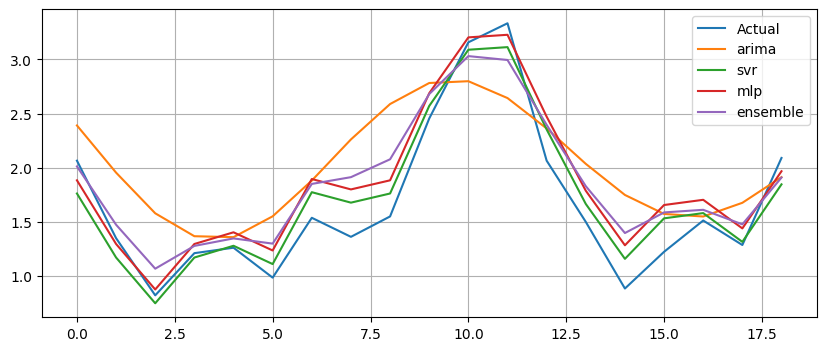

Generation 41: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18, 'l

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


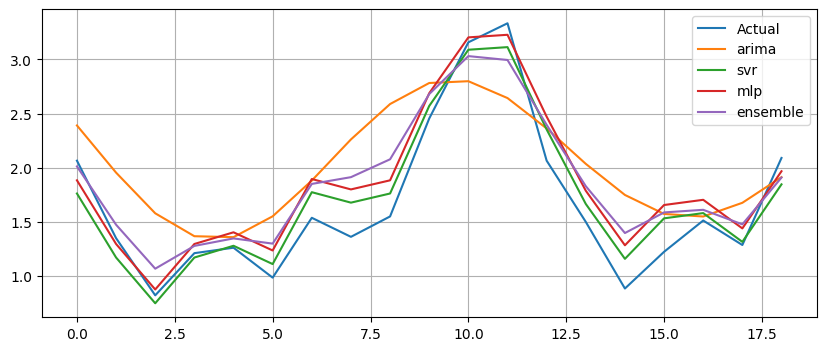

Generation 42: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854021412022144
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854543387206569
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6870597535576541
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516366854719316
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516323152535115
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.530966883644475
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18,

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


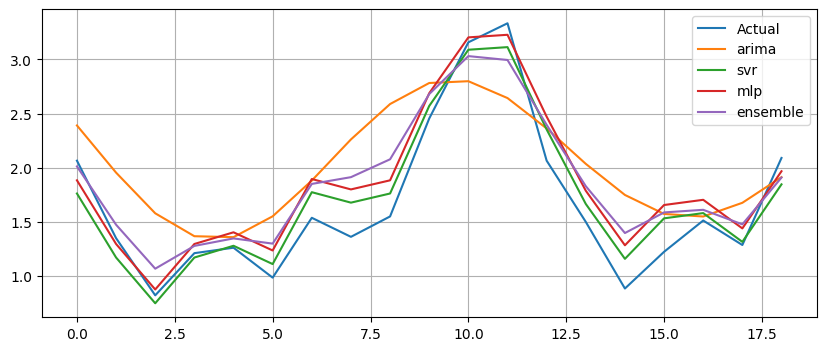

Generation 43: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854769169125408
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6853734114553673
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516243052586832
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516365490243917
SVRModel {'kernel': 'linear', 'c': 80.5014654166773, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18,

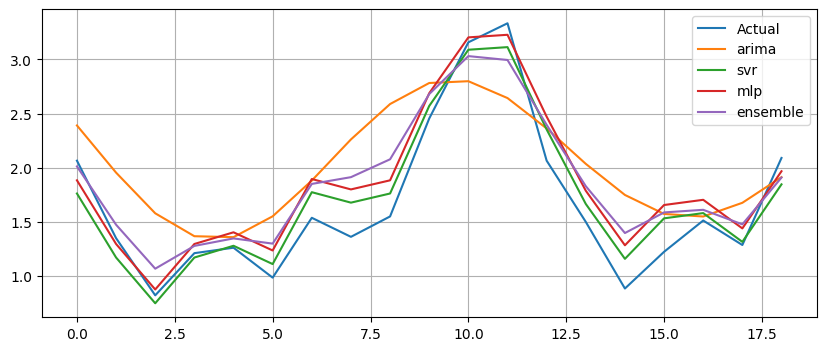

Generation 44: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854512841824403
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516411230087675
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.3498948206874, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.34746796771222, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18,

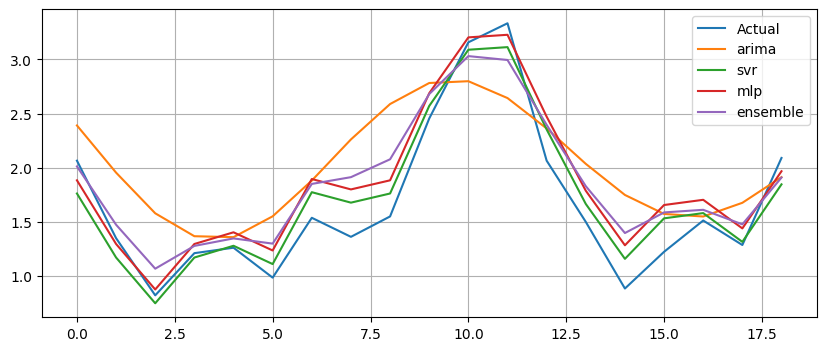

Generation 45: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6866304850348934
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.517767134765469
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 84.00947221208392, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18

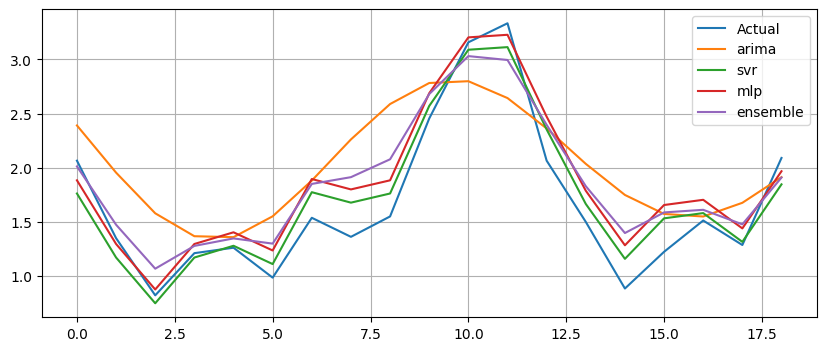

Generation 46: Fitness = 2.66906




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6877866876515728
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6365420373045638
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854946942522975
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 82.76271313774615, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 81.44265644606008, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.521996795603918
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516869999367709
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529133164471551
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 18, 'learning_r

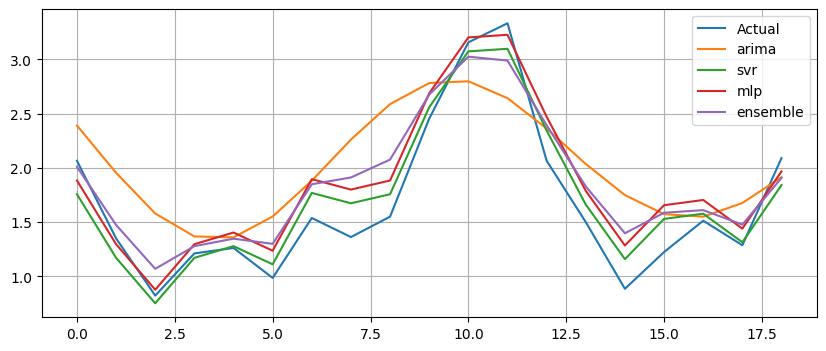

Generation 47: Fitness = 2.67254




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6966493576531294
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6875655403217282
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854946942522975
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685480063154988
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4934359867450129} Fitness: 4.536095234579973
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.529978735766198
SVRModel {'kernel': 'linear', 'c': 80.65825559535547, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529133164471551
SVRModel {'kernel': 'linear', 'c': 80.98029822242692, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
SVRModel {'kernel': 'linear', 'c': 80.19589737172231, 'gamma': 'scale', 'epsilon': 0.4905822594977991} Fitness: 4.516221329033422
MLPModel {'hidden_layer_sizes': 13, 'learning_r

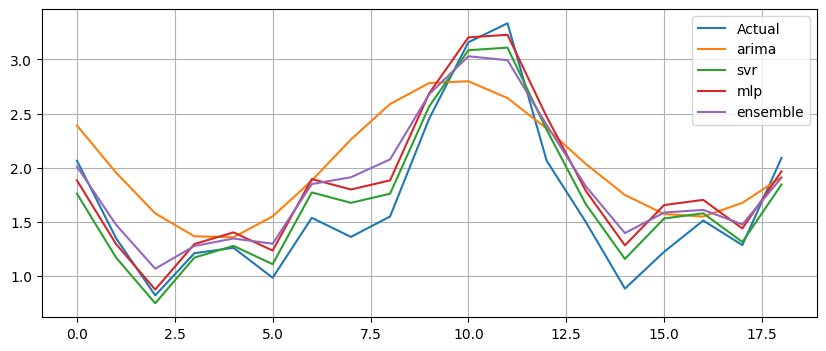

Generation 48: Fitness = 2.67013




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.107719561126216
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854840372338975
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854840372338975
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854840372338975
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
SVRModel {'kernel': 'poly', 'c': 80.65825559535547, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1344277007005972
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4934359867450129} Fitness: 4.5206413348677055
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4934359867450129} Fitness: 4.5206413348677055
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4934359867450129} Fitness: 4.5206413348677055
MLPModel {'hidden_layer_sizes': 18, 'learnin

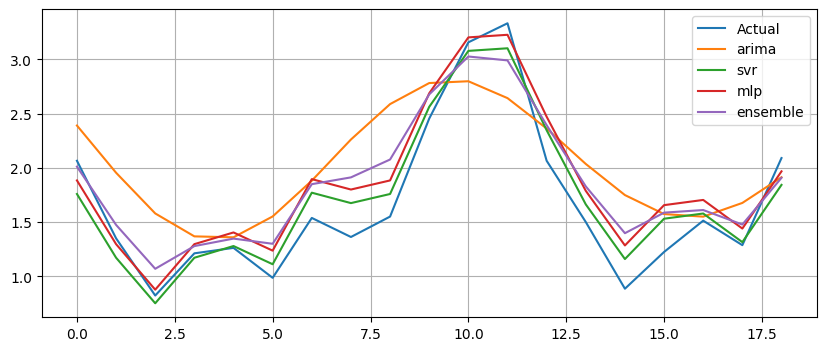

Generation 49: Fitness = 2.67150




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6856448609819807
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1503433471693927
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685485146287268
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685488583585391
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854763908719472
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.527677393550865
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.54419803099499
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.49418487021592644} Fitness: 4.521728551173546
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4963973892818727} Fitness: 4.524763095717009
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.43958732712580134} Fitness: 4.368988867157251
MLPModel {'hidden_layer_sizes':

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


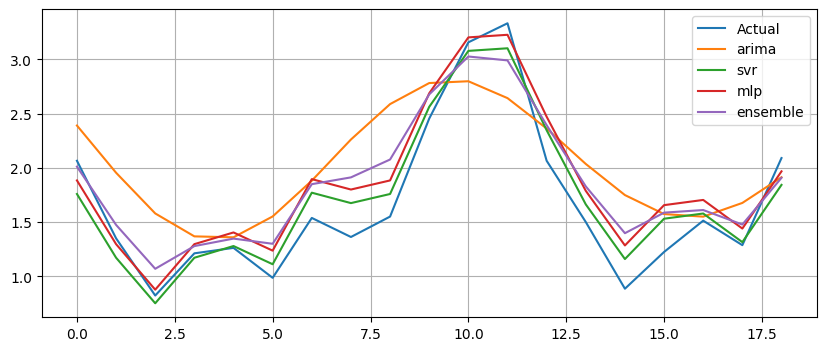

Generation 50: Fitness = 2.67150




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685400162228525
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854890015619646
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854638877680665
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.49688733186106604} Fitness: 4.525462374663479
SVRModel {'kernel': 'linear', 'c': 80.42918208448225, 'gamma': 'scale', 'epsilon': 0.4966563301735929} Fitness: 4.525100848357383
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525909621506455
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
MLPModel {'hidden_layer_sizes'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


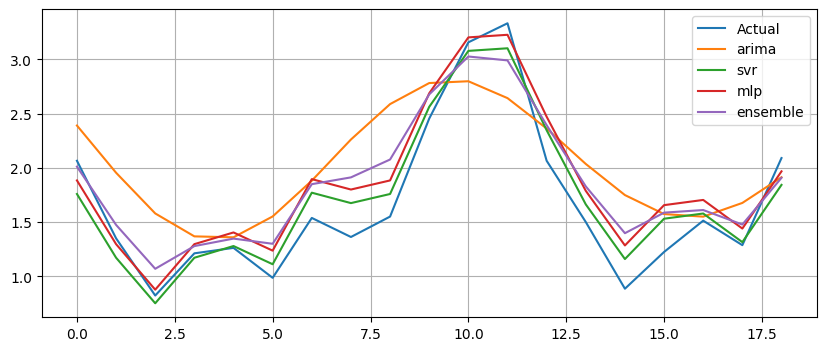

Generation 51: Fitness = 2.67150




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6891649389960104
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
SVRModel {'kernel': 'linear', 'c': 77.967581232295, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.53114373407317
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
MLPModel {'hidden_layer_sizes': 18

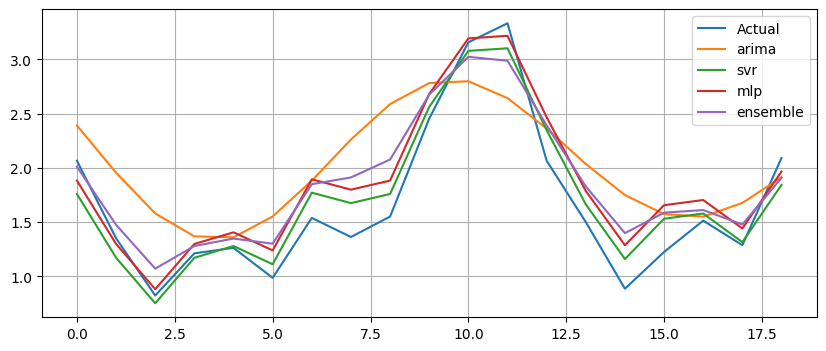

Generation 52: Fitness = 2.67010




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854898014143411
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
SVRModel {'kernel': 'linear', 'c': 80.87248063147746, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.30447233411769, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 81.09717069132746, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.07978227426769, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525729912328258
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
MLPModel {'hidden_layer_sizes': 18

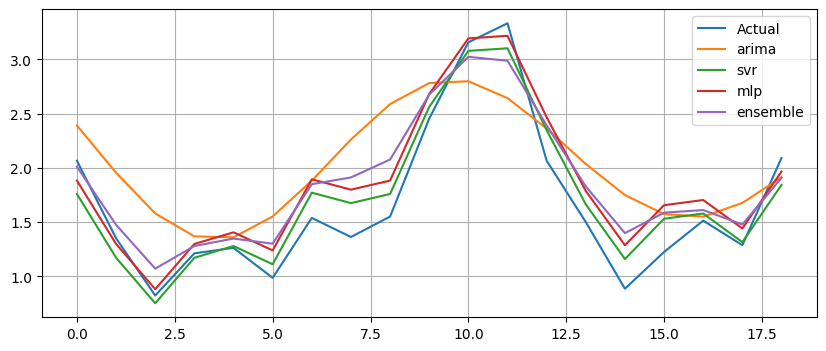

Generation 53: Fitness = 2.67010




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6884604497999949
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
SVRModel {'kernel': 'linear', 'c': 78.20712656329906, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.17712804508633, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.530132965694843
SVRModel {'kernel': 'linear', 'c': 80.45284932975261, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 81.20937173330015, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
MLPModel {'hidden_layer_sizes': 18

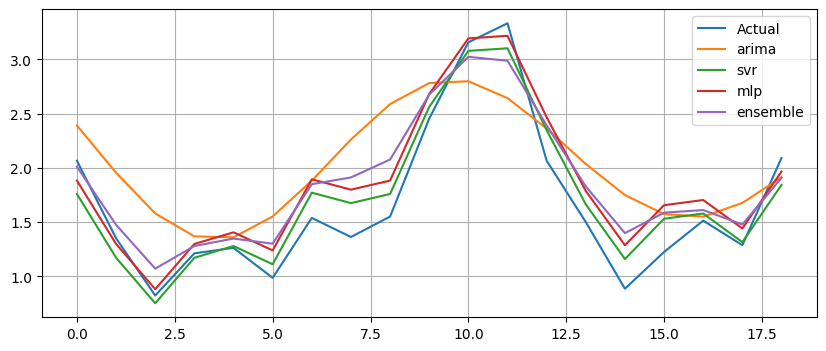

Generation 54: Fitness = 2.67010




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6957689790729347
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1110885693377037
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.547354957032992
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.20271335983603, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 80.37462073181865, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'poly', 'c': 78.20712656329906, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 1.1406878585205862
MLPModel {'hidden_layer_sizes': 15

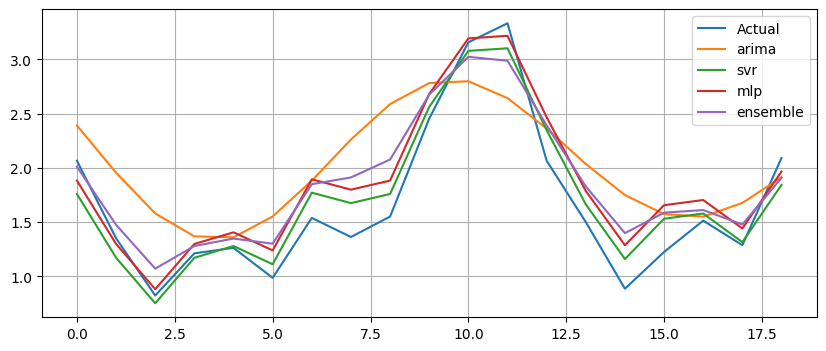

Generation 55: Fitness = 2.67010




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6265790628963332
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6861494216931425
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.526496082054604
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.528891065225209
SVRModel {'kernel': 'linear', 'c': 78.50057281328188, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
MLPModel {'hidden_layer_sizes': 1

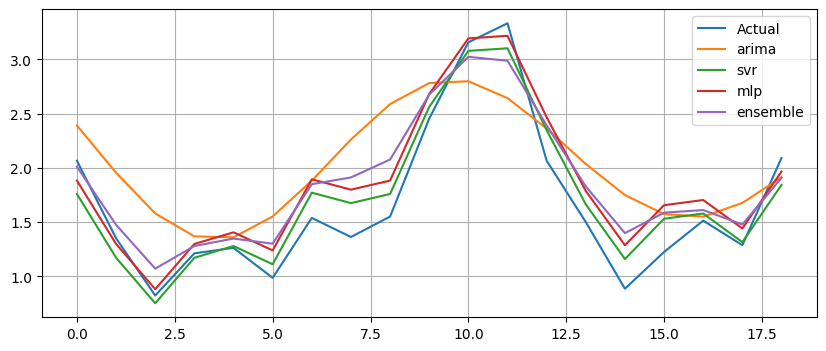

Generation 56: Fitness = 2.67010




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0453850563030567
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881442765690848
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6947486572787176
SVRModel {'kernel': 'linear', 'c': 78.72410363584252, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.552964637348414
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.46813384603185, 'gamma': 'scale', 'epsilon': 0.4395006256343154} Fitness: 4.368160073979539
SVRModel {'kernel': 'rbf', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 1.49490611511805
MLPModel {'hidden_layer_sizes': 18, 

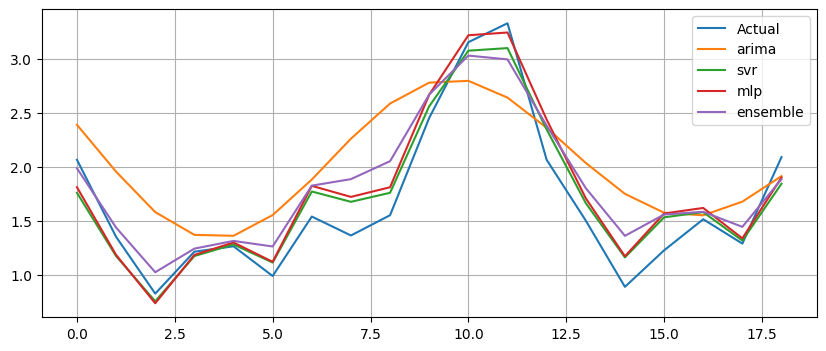

Generation 57: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.685425540309213
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6854010571662543
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525713599704241
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.47483721683496494} Fitness: 4.484110999192508
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
MLPModel {'hidden_layer_sizes'

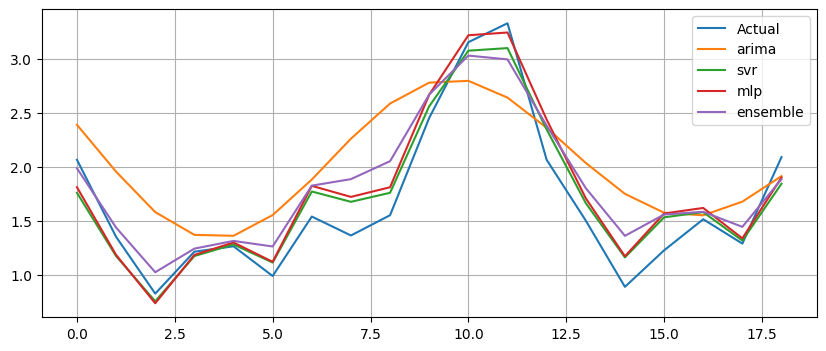

Generation 58: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1150657769254426
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
SVRModel {'kernel': 'linear', 'c': 82.34573716160789, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'poly', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 1.13714684369958
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
MLPModel {'hidden_layer_sizes': 2

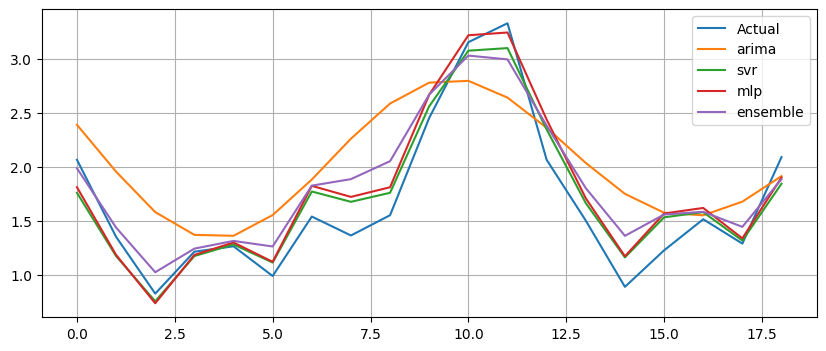

Generation 59: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6879086630451212
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1139072439825277
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8723920344763353
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.863435569050131
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.530257700914471
SVRModel {'kernel': 'poly', 'c': 82.34573716160789, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 1.1353493458861403
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.42624418239669, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.579096595304604
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.581841959099085
MLPModel {'hidden_layer_sizes': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


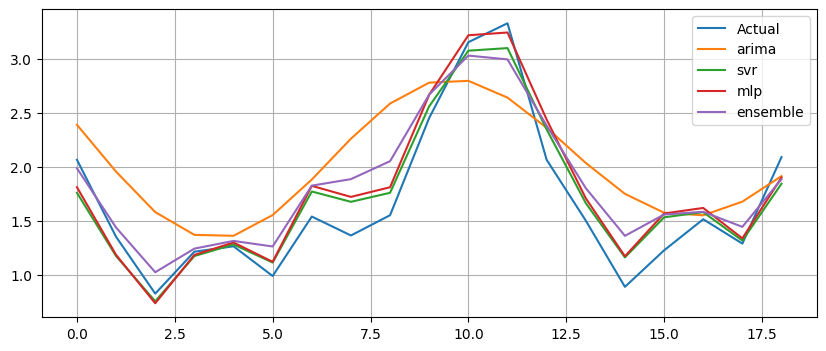

Generation 60: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6295548789268024
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525945197019949
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
MLPModel {'hidden_layer_sizes'

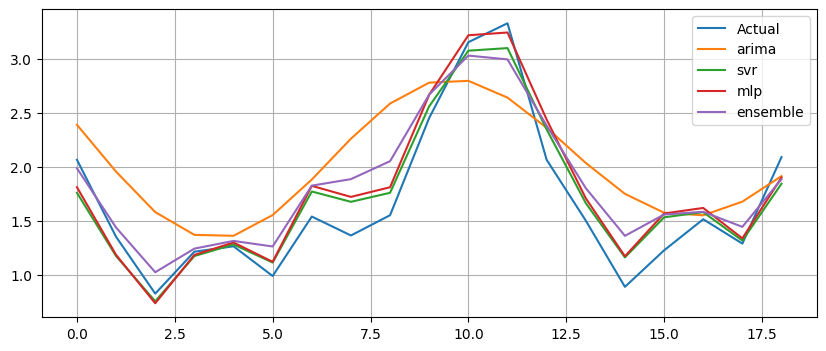

Generation 61: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 87.02715959973972, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
MLPModel {'hidden_layer_sizes'

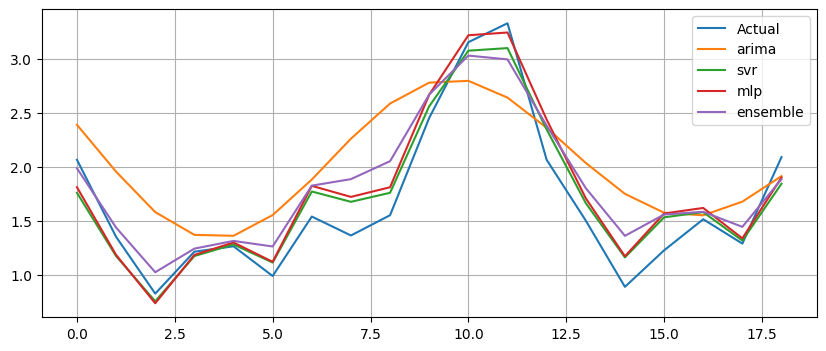

Generation 62: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688090976538254
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6857673915387978
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 87.02715959973972, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.466156646297653} Fitness: 4.460544350334875
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.529447574591256
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
MLPModel {'hidden_layer_sizes': 20, 'learning_r

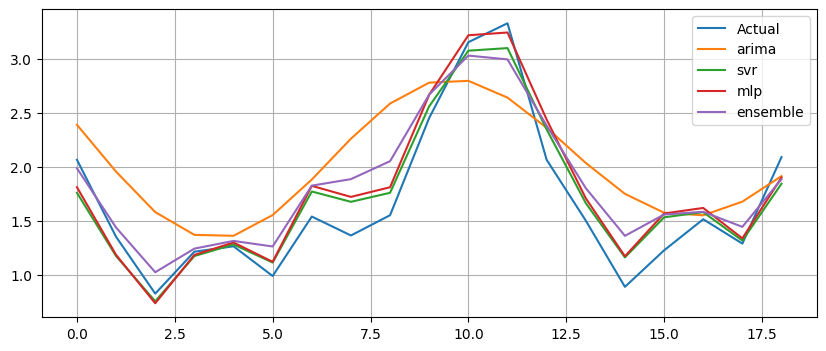

Generation 63: Fitness = 2.86449




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881575847422727
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881379951157105
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881608845650935
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.4971462727527862} Fitness: 4.525162714669586
SVRModel {'kernel': 'linear', 'c': 78.68221397220736, 'gamma': 'scale', 'epsilon': 0.48165662721340996} Fitness: 4.499059530999269
SVRModel {'kernel': 'linear', 'c': 87.02715959973972, 'gamma': 'scale', 'epsilon': 0.4990960898759254} Fitness: 4.527533308471257
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
MLPModel {'hidden_layer_sizes': 20, 'learnin

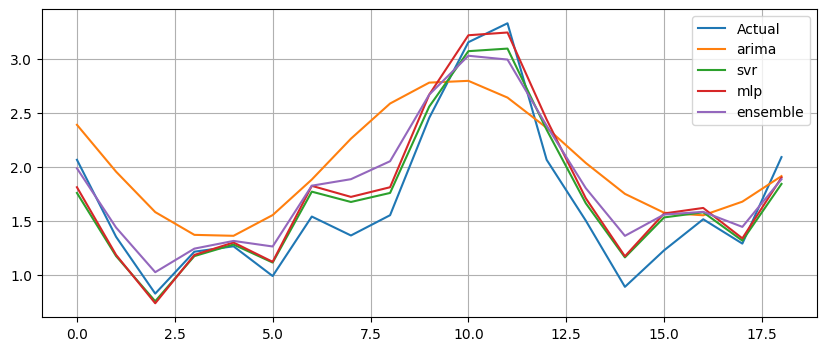

Generation 64: Fitness = 2.86559




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881608845650935
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6879293348044093
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6880506345690989
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 87.02715959973972, 'gamma': 'scale', 'epsilon': 0.49909608987592546} Fitness: 4.527533308471257
SVRModel {'kernel': 'linear', 'c': 87.02715959973972, 'gamma': 'scale', 'epsilon': 0.42380074511716403} Fitness: 4.003094126064374
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528601073246171
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.09037457438283297}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


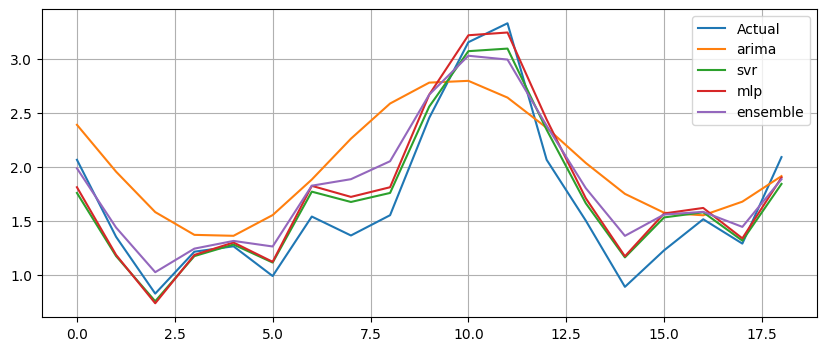

Generation 65: Fitness = 2.86559




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688867646719446
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.538465643543662
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
MLPModel {'hidden_layer_sizes': 14, 'learning_rate': 0.09037457438283297} Fitness: 1.7263834176486237
MLPM

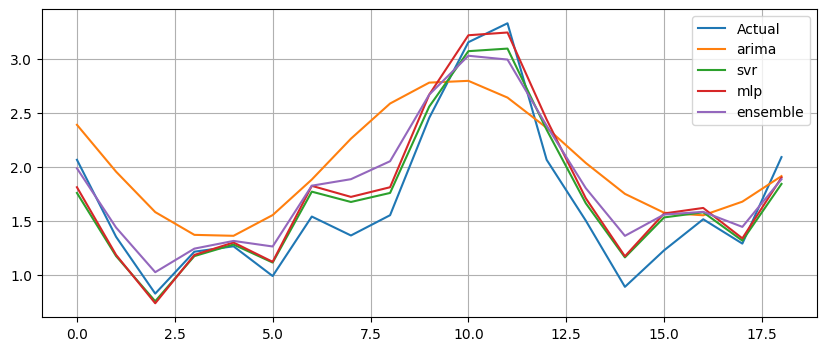

Generation 66: Fitness = 2.86559




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6242094893747683
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6874639955260986
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.533089925376134
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528997701066423
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.09037457438283297} Fitness: 4.180115489431707
MLP

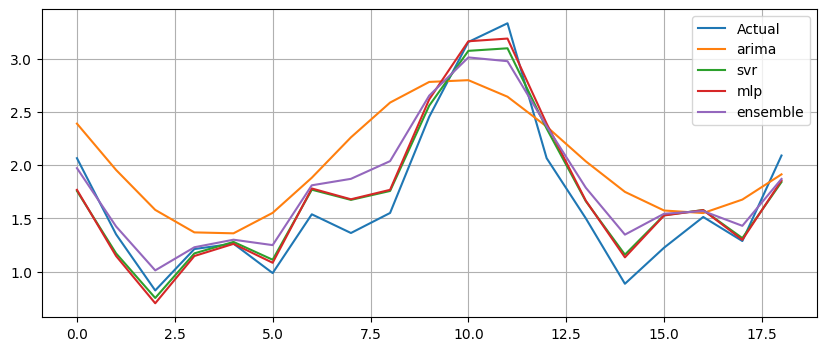

Generation 67: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.875789354649308
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1100324505275254
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.582380042672167
SVRModel {'kernel': 'poly', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1293735326032264
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
MLPMo

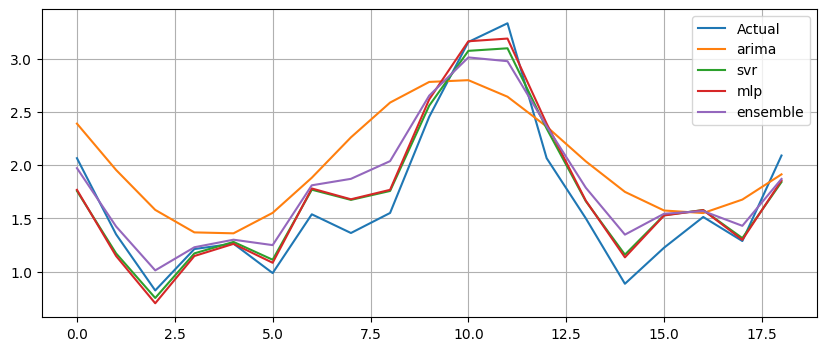

Generation 68: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6881624775802289
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6305172952126146
SVRModel {'kernel': 'linear', 'c': 83.87346606926558, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528561641951475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529193015252928
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

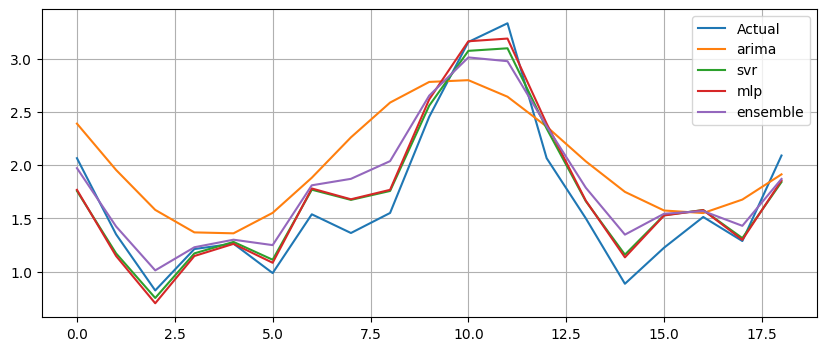

Generation 69: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688991061288615
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 89.63656789069401, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528412103000411
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

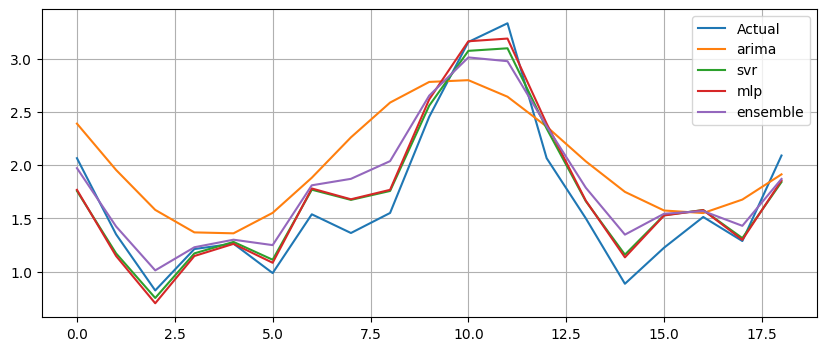

Generation 70: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 89.63656789069401, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641


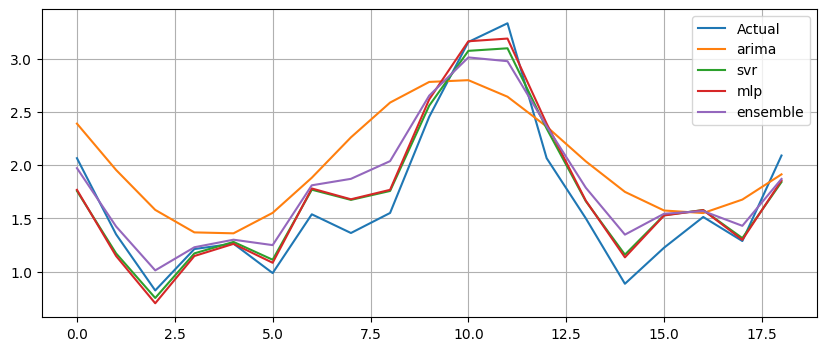

Generation 71: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1310681283715176
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.8749503879892132
SVRModel {'kernel': 'linear', 'c': 89.63656789069401, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 98.36684580065881, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.548149017135471
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.582413834473143
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


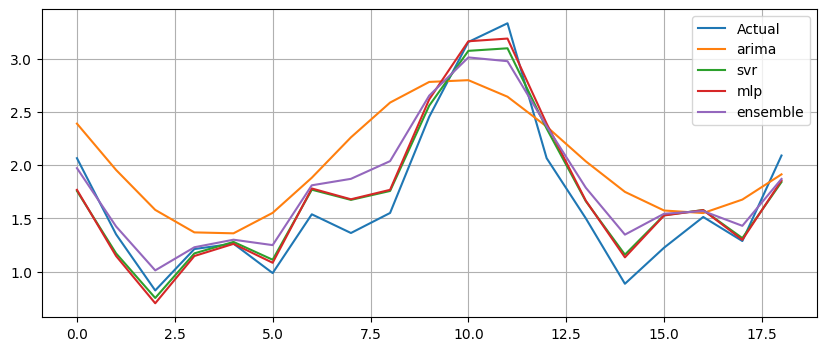

Generation 72: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.683025281521965
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.1108792036889246
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531201478406475
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'poly', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1330505935535493
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
MLPM

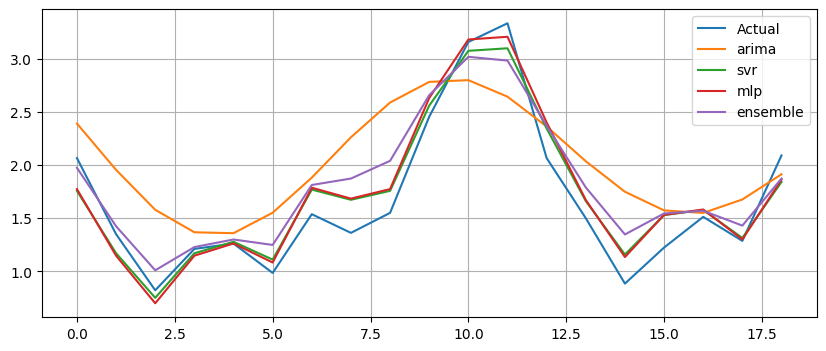

Generation 73: Fitness = 2.93305




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1568461342489234
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0537837973910302
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0532661776355665
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546864936983866
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.45151287048414374} Fitness: 4.441332135124902
SVRModel {'kernel': 'linear', 'c': 84.68529269842762, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555654086104739
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.06925084161807908} Fitness: 4.49

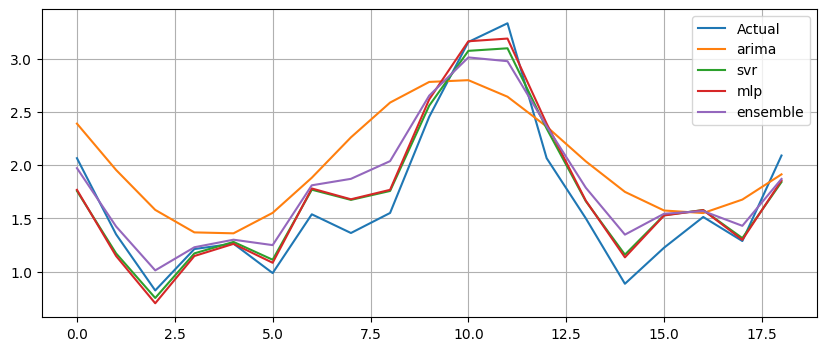

Generation 74: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1698559116871565
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1567466272201146
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6884274438815723
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.111246461152408
SVRModel {'kernel': 'linear', 'c': 77.66459550314461, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 79.24601871374487, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.566041082468477
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546838860028615
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528504150294744
SVRModel {'kernel': 'poly', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1352825873586068
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
MLPMod

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


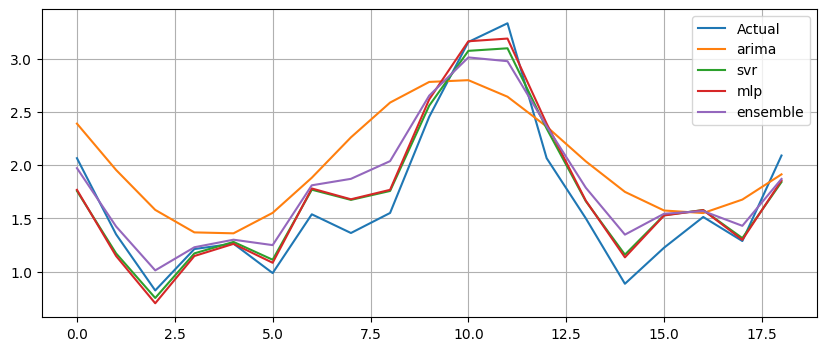

Generation 75: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.692655160467654
SVRModel {'kernel': 'linear', 'c': 79.24601871374487, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 82.92275741651913, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.542093443495531
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

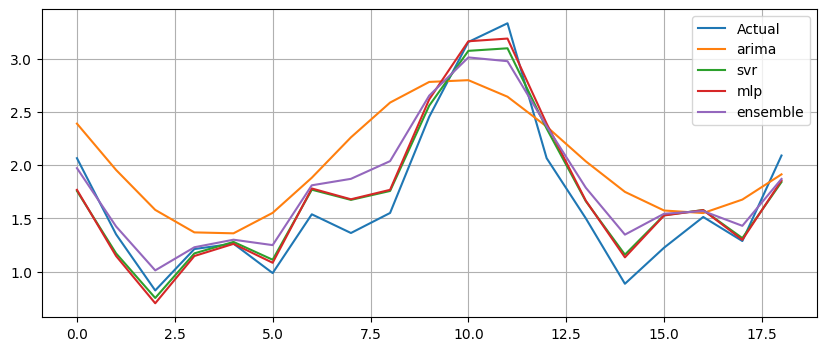

Generation 76: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6885214895806855
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8669526061276267
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528483083984156
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5851291216215655
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08320093121989224} Fitness: 4.32842478227961
M

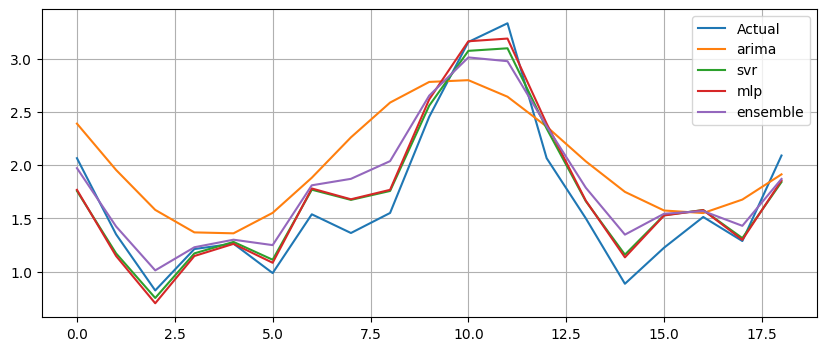

Generation 77: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.053197262842326
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688916445127116
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555628009149489
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528467150754676
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.550642731582113
MLP

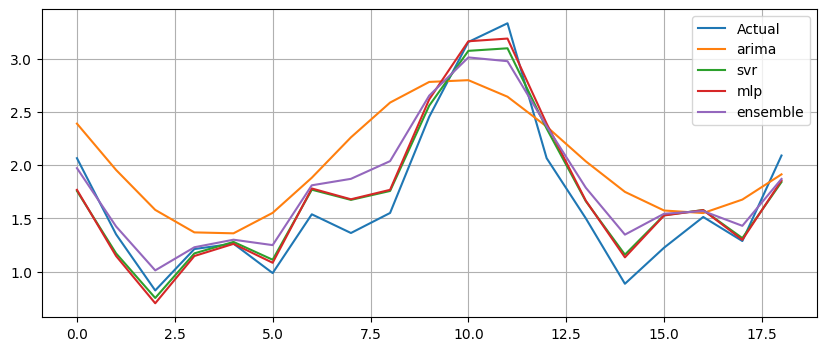

Generation 78: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.053197262842326
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555628009149489
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

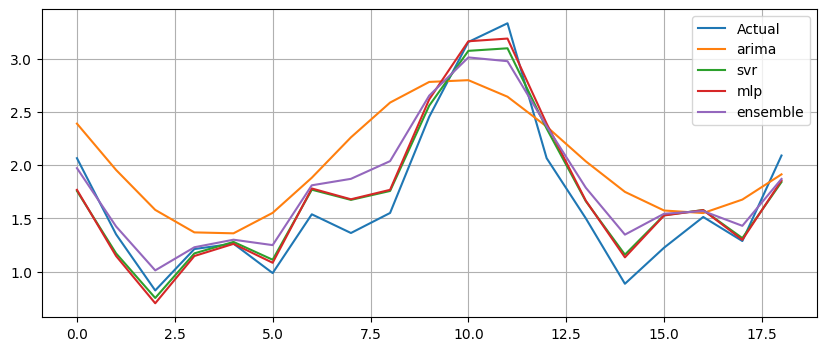

Generation 79: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 0, 'd': 1, 'q': 4} Fitness: 1.1567466272201146
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546838860028615
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
M

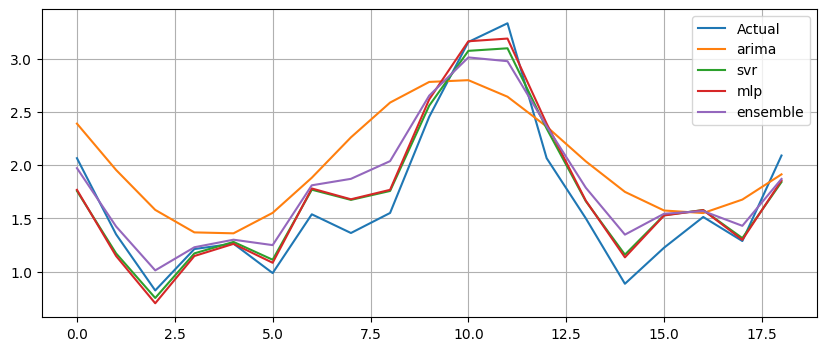

Generation 80: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.132063870576599
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.053197262842326
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.561117456558024
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555628009149489
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 21, 'learning_rate': 0.08043657360803146} Fitness: 1.5294680283042021
ML

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


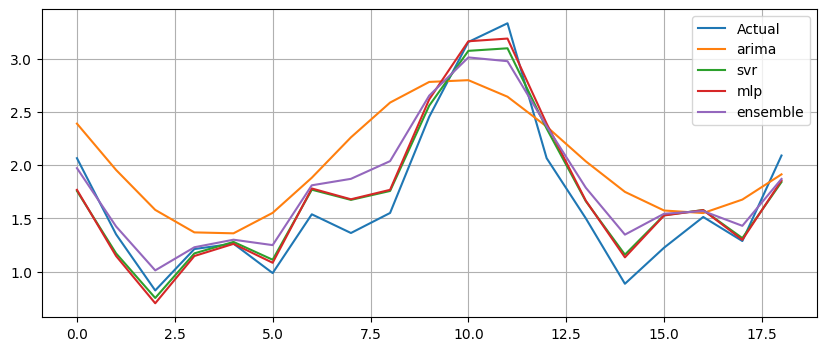

Generation 81: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688611000568789
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528441381900639
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

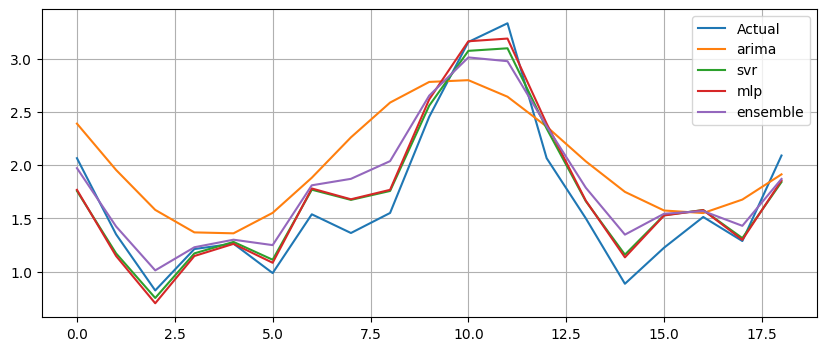

Generation 82: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.111246461152408
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.111246461152408
SVRModel {'kernel': 'poly', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1352825873586068
SVRModel {'kernel': 'linear', 'c': 66.84123786974607, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'poly', 'c': 72.22532151846187, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1352825873586068
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.897026248082695
MLPMo

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


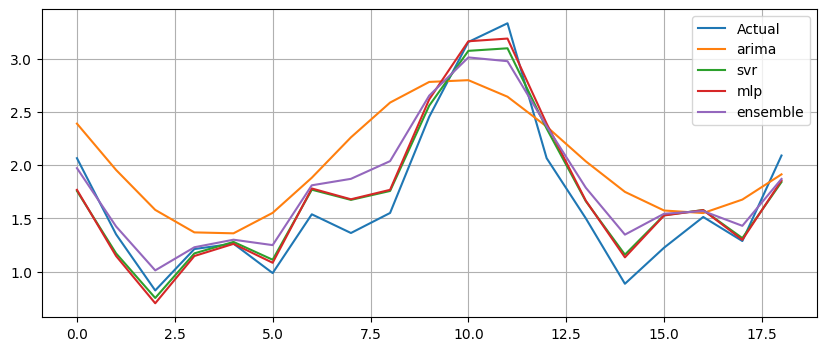

Generation 83: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6984672215418615
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'rbf', 'c': 79.07645398276769, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4922816535456427
SVRModel {'kernel': 'linear', 'c': 71.72746669640615, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 66.84123786974607, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.538311200756991
ML

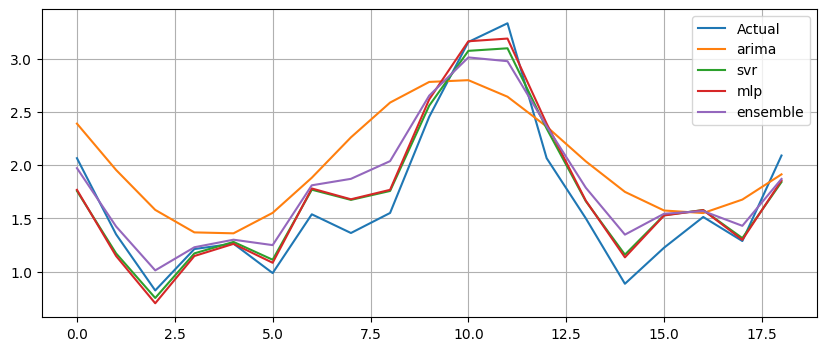

Generation 84: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1660641532256304
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 71.72746669640615, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 66.84123786974607, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546605115227099
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 66.84123786974607, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
M

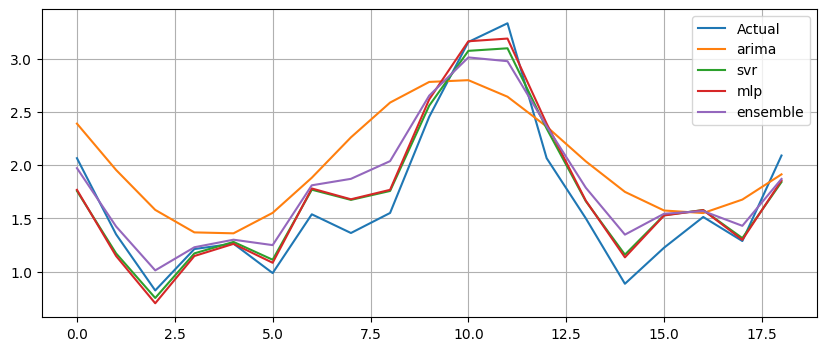

Generation 85: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 2.111255576047622
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1310681283715176
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890062502297791
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'poly', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1352968176701888
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.548149017135471
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528421017012772
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
MLPMo

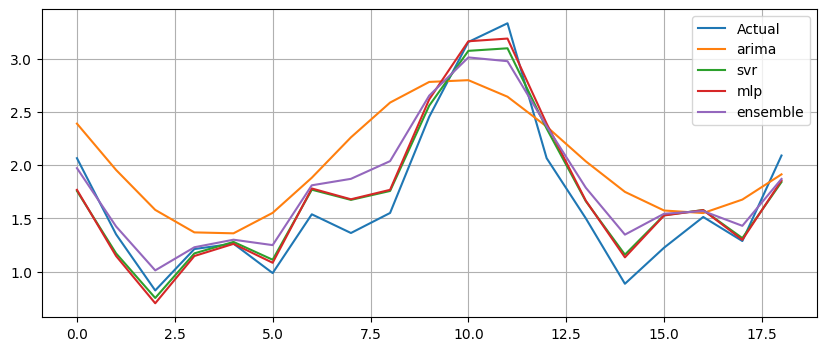

Generation 86: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1381307619473369
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.052570603231777
SVRModel {'kernel': 'linear', 'c': 85.13245477234324, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5472758550865695
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555676251400963
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641
ML

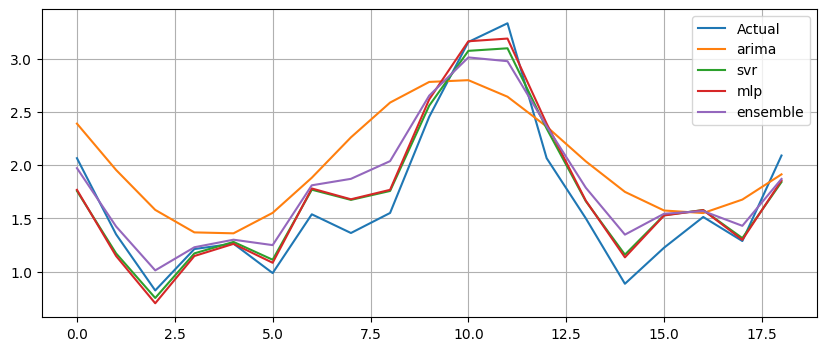

Generation 87: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8669526061276267
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6889963633527865
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6900032591934835
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5851291216215655
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.4583356478197657} Fitness: 4.43662954244026
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.542250736876284
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.579

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


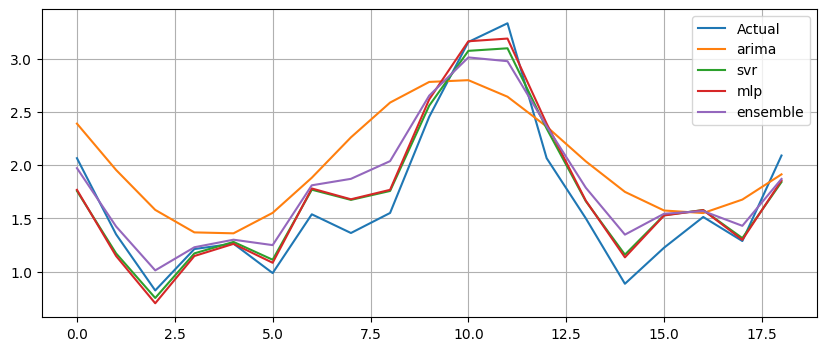

Generation 88: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.053197262842326
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890071120203418
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1381307619473369
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555628009149489
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.4852078184308899} Fitness: 4.50605121616644
SVRModel {'kernel': 'linear', 'c': 77.3196294597927, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5472758550865695
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.55064

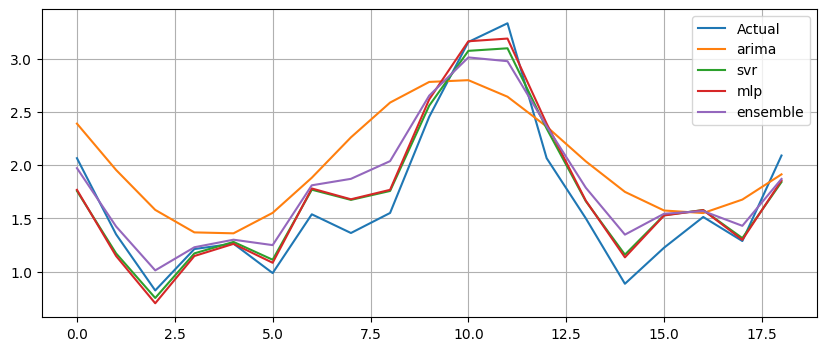

Generation 89: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8669526061276267
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688302353052594
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6883162082816052
ArimaModel {'p': 3, 'd': 1, 'q': 2} Fitness: 1.171854872271775
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5851291216215655
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.37446316952627, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528514998115693
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528362512782959
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546028543375748
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.579578557882298
MLPM

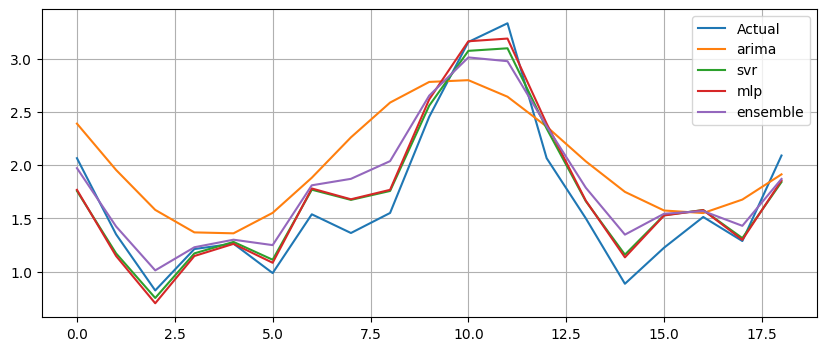

Generation 90: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.86247315490075, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 84.27500787245977, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 83.96268280942778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803146} Fitness: 4.52196250807641


/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


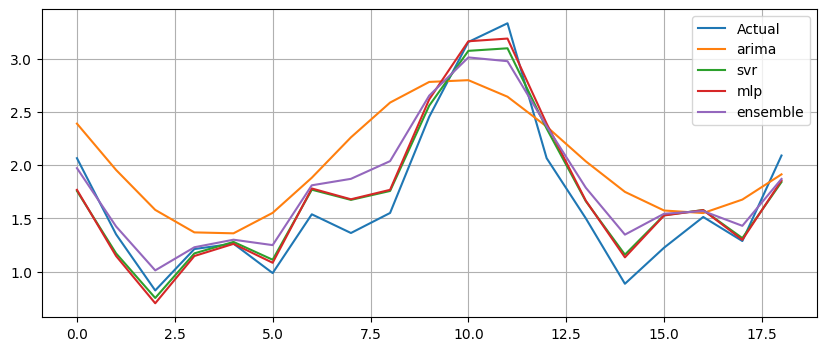

Generation 91: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1381307619473369
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6984672215418615
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1648538568975284
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5472758550865695
SVRModel {'kernel': 'linear', 'c': 83.86247315490075, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'rbf', 'c': 84.23157486440044, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4922816535456427
SVRModel {'kernel': 'linear', 'c': 84.0061158174871, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.550518320632789
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.542001544030024
MLPM

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


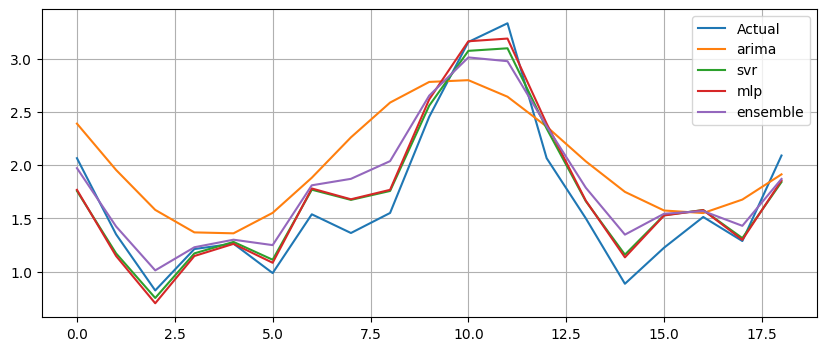

Generation 92: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688969358400766
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6909032623696783
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6984672215418615
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.1660641532256304
ArimaModel {'p': 3, 'd': 1, 'q': 1} Fitness: 0.8669526061276268
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528415216925835
SVRModel {'kernel': 'linear', 'c': 84.0061158174871, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5408498261086585
SVRModel {'kernel': 'rbf', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4922816535456427
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546605115227099
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5851291216215655
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08085314736480666} Fitness: 4.501146530400516
MLPMod

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


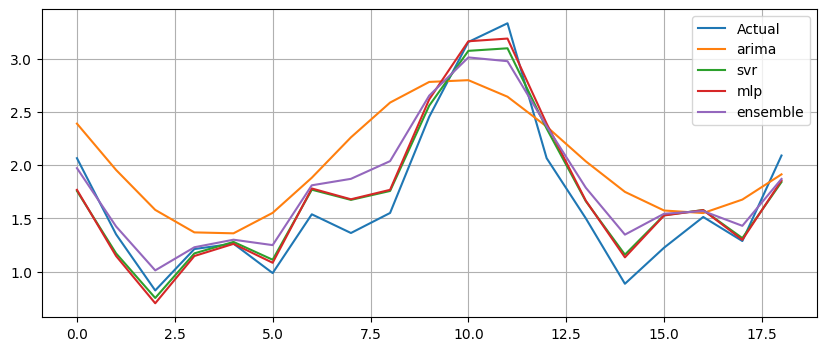

Generation 93: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6880883451361284
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540879545011571
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 95.08440461314714, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.5219625080764105

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


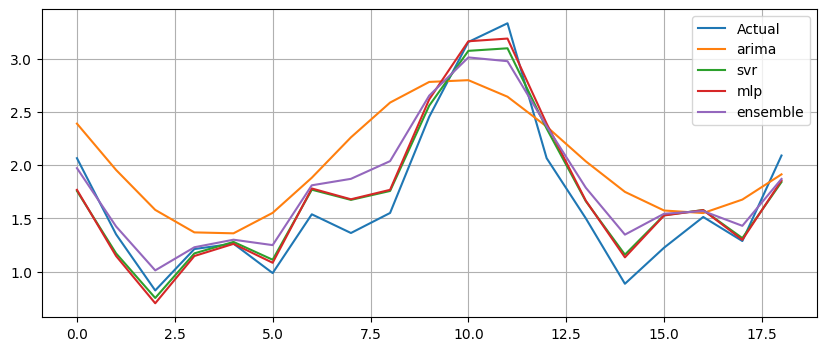

Generation 94: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1381307619473369
SVRModel {'kernel': 'linear', 'c': 90.46418897637261, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 89.04546436141666, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 92.10107835822475, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5472758550865695
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.5219625080764105

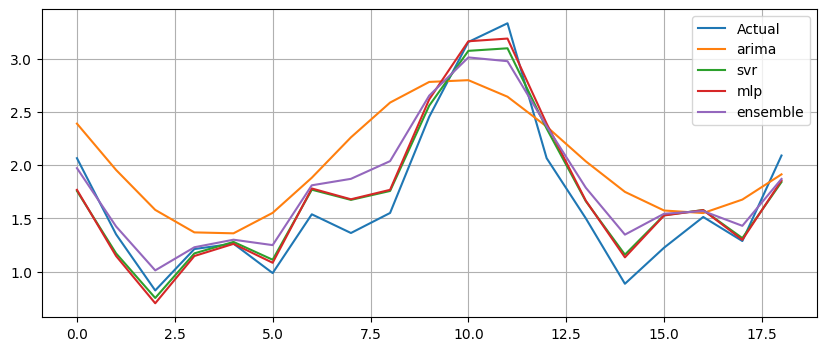

Generation 95: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6887912168249737
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.053197262842326
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.688678746949048
SVRModel {'kernel': 'linear', 'c': 92.10107835822475, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.535372488248034
SVRModel {'kernel': 'linear', 'c': 92.10107835822475, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555628009149489
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 86.06213810649427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528449296190122
MLPModel {'hidden_layer_sizes': 30, 'learning_rate': 0.08043657360803144} Fitness: 1.9924918225598611
MLPM

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


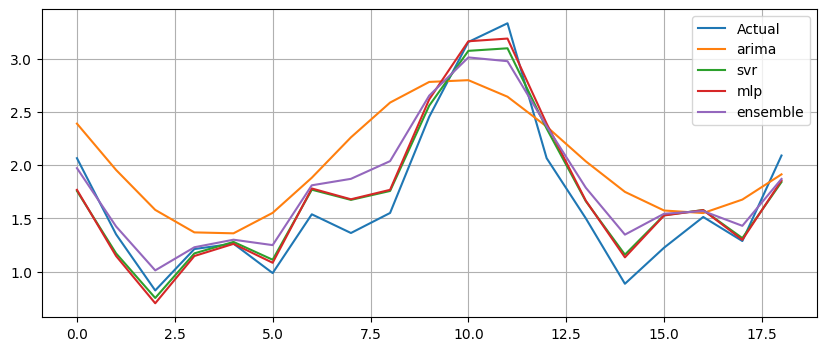

Generation 96: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6403675834113858
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 91.44375949090173, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529062326762911
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.5219625080764105
ML

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


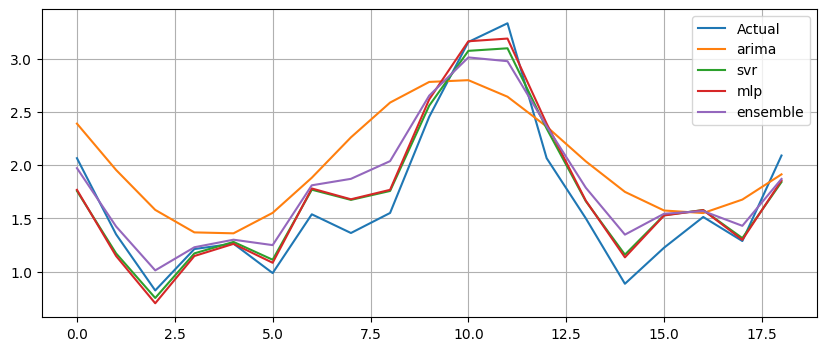

Generation 97: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.689020383843237
ArimaModel {'p': 4, 'd': 1, 'q': 4} Fitness: 1.6305172952126146
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.44375949090173, 'gamma': 'scale', 'epsilon': 0.495355522330614} Fitness: 4.52266147628732
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529193015252928
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.521962

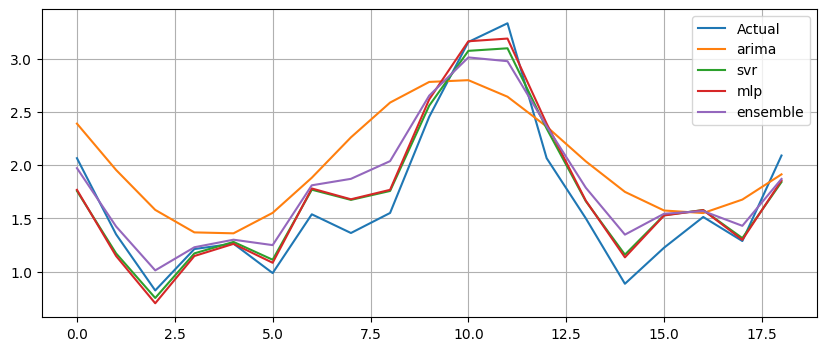

Generation 98: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6856700624757086
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6884758141600786
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.33967261059183, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.01932345672347, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.53318364991842
SVRModel {'kernel': 'linear', 'c': 91.00270289713717, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528466514199886
SVRModel {'kernel': 'linear', 'c': 90.6823537432688, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.5219625080764105
ML

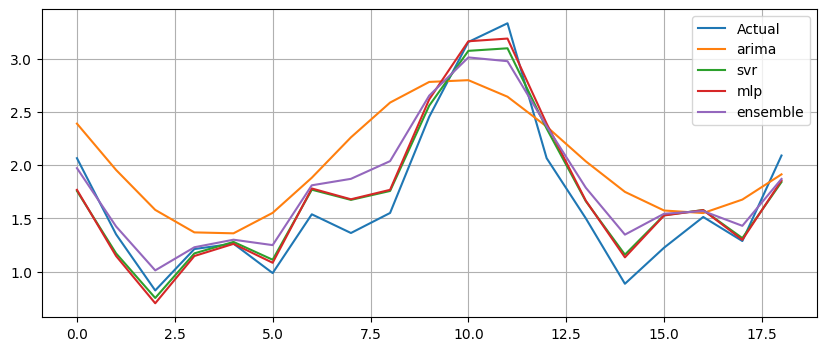

Generation 99: Fitness = 2.93778




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890448256222608
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
ArimaModel {'p': 2, 'd': 1, 'q': 4} Fitness: 1.1381307619473369
ArimaModel {'p': 3, 'd': 1, 'q': 4} Fitness: 1.6890281430318952
SVRModel {'kernel': 'linear', 'c': 91.01932345672347, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.01932345672347, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528408529881775
SVRModel {'kernel': 'linear', 'c': 91.00270289713717, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
SVRModel {'kernel': 'linear', 'c': 91.01932345672347, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5472758550865695
SVRModel {'kernel': 'linear', 'c': 87.58536902005903, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284091354048295
MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.08043657360803144} Fitness: 4.5219625080764105

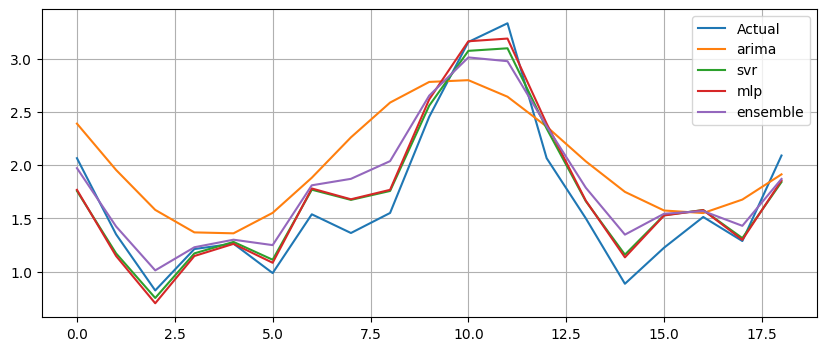

Generation 100: Fitness = 2.93778




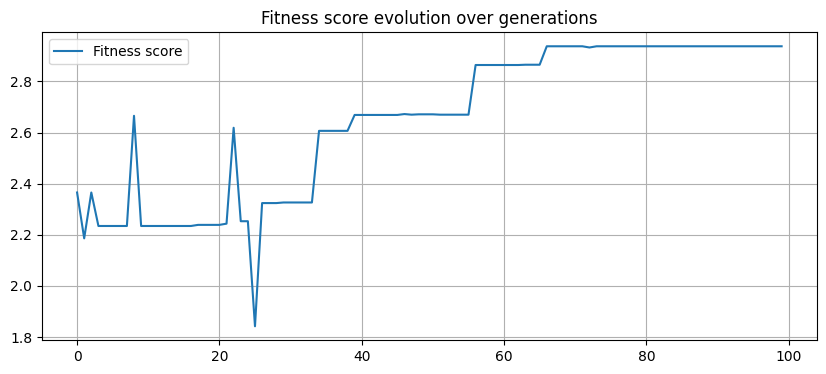

In [17]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 5
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, data)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, data['X_val_scaled'], data['y_val_scaled'])
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = tournament_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()